# Transcription Factor Project - QC
**Robin Anwyl, UCSD Subramaniam Lab**

**Goal:** Analyze the hiPSC Perturb-seq dataset from the Mali lab (Nourreddine et al preprint) to investigate the effects of transcription factor knockouts (TF KOs)

**Guiding Questions:** What do TF KO effects reveal about:
* … the transcription regulatory network of hiPSCs, and TF crosstalk?
* … cell lineage?
* … how TFs influence chromatin remodeling?

***

# Import statements

In [1]:
import muon as mu
import anndata as ad
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
#import re
#import requests
import gc
from plotnine import ggplot, aes, geom_bar, ggtitle, xlab, ylab, scale_fill_manual, geom_histogram, labs, theme, element_text, scale_y_continuous
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
from tqdm.auto import tqdm
from statsmodels.stats.multitest import multipletests
from scipy.stats import mannwhitneyu
from scipy.stats import ks_2samp
from scipy.stats import gamma
from scipy.stats import spearmanr
import seaborn as sns
import dcor
from joblib import Parallel, delayed
from tqdm import tqdm
from tqdm_joblib import tqdm_joblib
from joblib import delayed, parallel_backend, Parallel
import networkx as nx
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
import openpyxl
from IPython.display import display  #type: ignore
from scipy.spatial.distance import pdist, squareform #type: ignore
import plotly.express as px #type: ignore
import plotly.graph_objects as go #type: ignore
import pymde #type: ignore
import plotly.io as pio #type: ignore
from sklearn.preprocessing import StandardScaler #type: ignore
from sklearn.neighbors import kneighbors_graph #type: ignore
from sklearn.manifold import SpectralEmbedding
import igraph as ig #type: ignore
import leidenalg #type: ignore
import sys
import os
sys.path.insert(0, "/home/ranwyl/data_tf_project/")
import perturb_seq_heuristic_pipeline as qc
import pan_genome_analysis_functions as qc2

Note: use terminal command " watch -n 0.1 free -h " to watch how much memory is being used

# QC pipeline - run through step F, then switch to analysis notebook

The `perturb_seq_heuristic_pipeline.py` file containing the QC and analysis pipeline from Nourreddine et al was imported as `qc`. Functions from `Pan_Genome_Analysis.ipynb`, a notebook containing additional code from Nourreddine et al, were pasted into a file `pan_genome_analysis_functions.py` which was imported as `qc2`.

## Initial data read-in

We will read in the Perturb-seq single-cell dataset `.h5mu` file as a `MuData` object, `mdata`.

`mdata` contains two modalities which are `AnnData` objects: `rna` (cell-by-gene matrix) and `crispr` (cell-by-knockout matrix)
- `rna`: 5386783 cells x 38606 features  
    - Features = expression of each human gene measured in the dataset
    - `.obs` = cell barcodes, `.var` = features = genes
- `crispr`: 5386783 cells x 35989 features
    - Features = CRISPR sgRNAs (3 sgRNAs per gene target * 11739 gene targets, plus 478 non-targeting control sgRNAs)
    - `.obs` = cell barcodes, `.var` = features = knockouts

We will be working with the `rna` modality for the majority of the analysis. We will assign it to the variable `adata`.

In [3]:
md_filepath = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Aggregate.h5mu"
mdata = mu.read_h5mu(md_filepath)
adata = mdata.mod["rna"]

In [ ]:
crispr = mdata.mod['crispr']

## Step B: Assigning sgRNA to cells and de facto doublet detection

The lists of cells and genes provided by the Mali lab are the output of step D; however, steps E through F require metadata annotation, meaning that it would make the most sense to run the pipeline on the `KOLF_Pan_Genome_Aggregate.h5mu` file through step F. First, we will run step B: assigning sgRNA to cells based on the protospacer calls and removing cells without exactly one sgRNA assigned (cells with < 1 sgRNA assigned must be removed, and cells with > 1 sgRNA assigned are considered de facto multiplets).

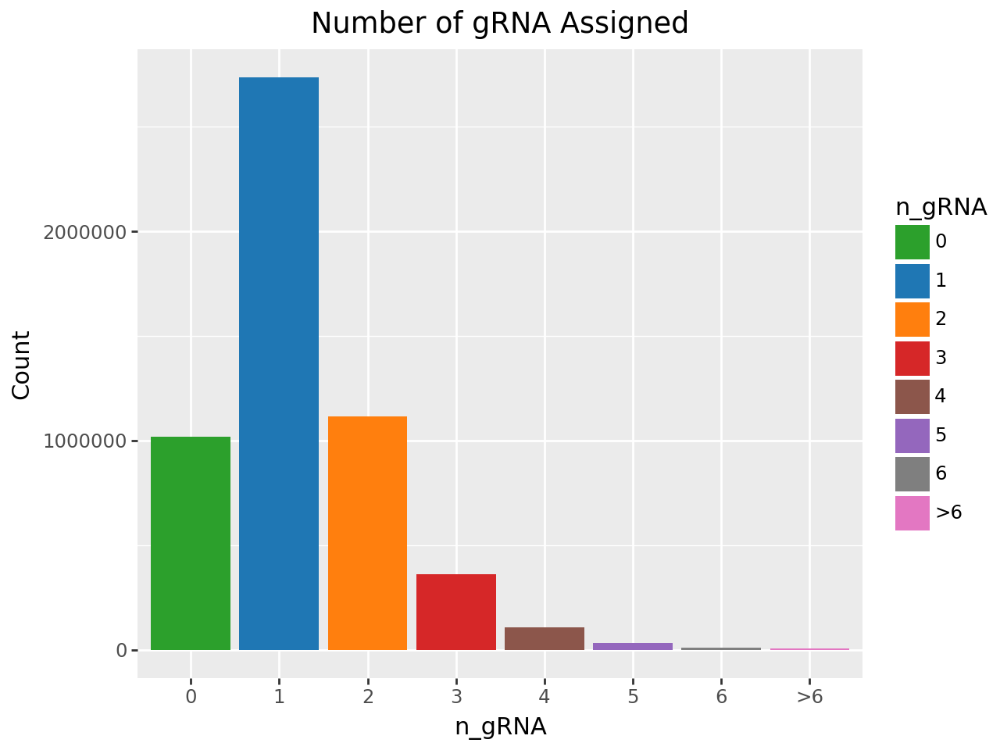

Cells without confident sgRNA calls: 18.89%
Estimated Multiplet Rate: 30.33%


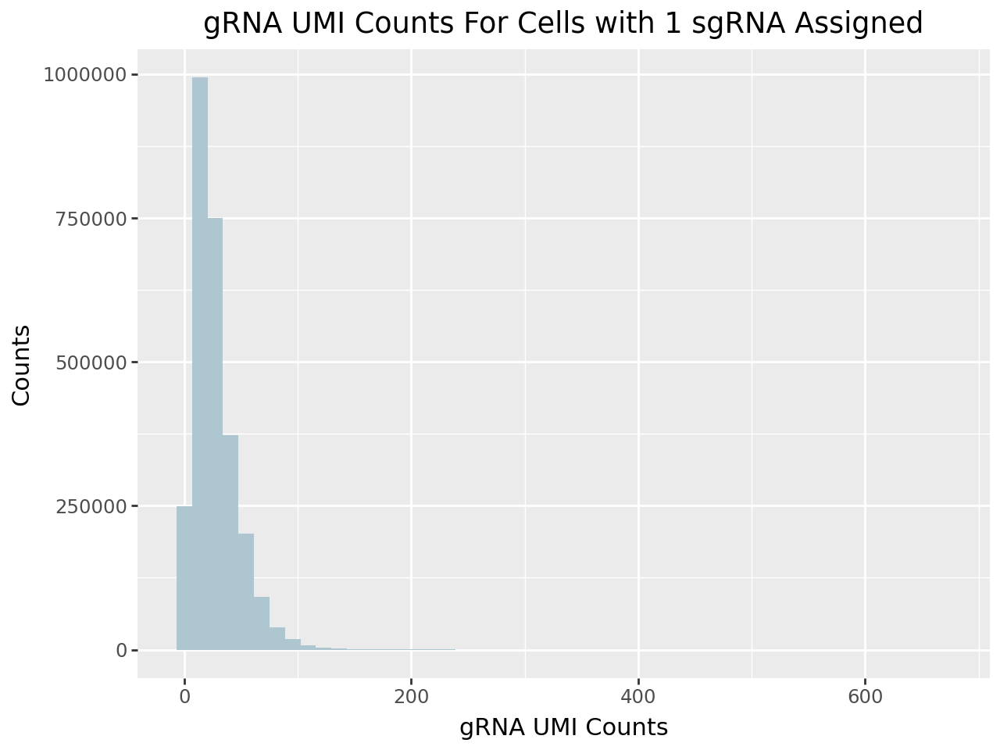

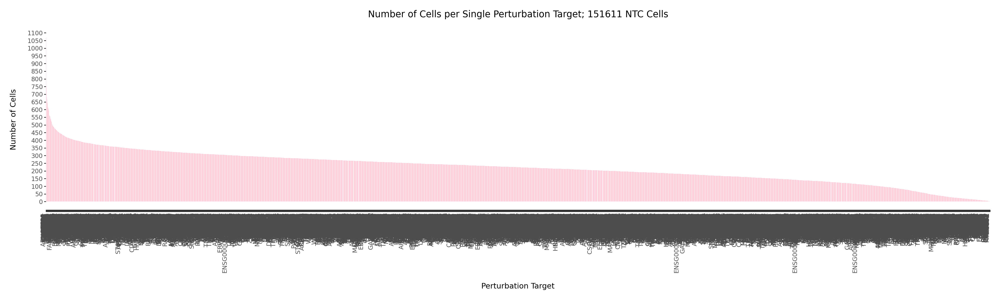

Number of perturbations with >= 50 cells with single guide assigned: 10933/11687 (93.55%)


In [4]:
protospacer_calls_file_path = "/home/ranwyl/data_tf_project/protospacer_calls_per_cell.csv"
adata = qc.assign_protospacers(adata,protospacer_calls_file_path=protospacer_calls_file_path)

## Step C: Cell-level QC

Now we will run step C, cell-level QC. First, we assign metadata:

In [5]:
aggregation_csv_file_path = "/home/ranwyl/data_tf_project/aggregation_csv.csv"
d = pd.read_csv(aggregation_csv_file_path)
channel_dict = {str(i+1):channel for i,channel in enumerate(d["sample_id"])}
adata = qc.assign_metadata(adata=adata,cell_type="KOLF2.1J iPSC",perturbation_type="CRISPRi Perturb-Seq",channel_dict=channel_dict)
adata.obs['n_gRNA_UMIs'] = adata.obs['n_gRNA_UMIs'].astype(str)

/home/ranwyl/data_tf_project/perturb_seq_heuristic_pipeline.py:175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


In [6]:
adata

AnnData object with n_obs × n_vars = 2735450 × 38606
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells'

Remove genes not detected in any cells

normalizing counts per cell
    finished (0:01:17)


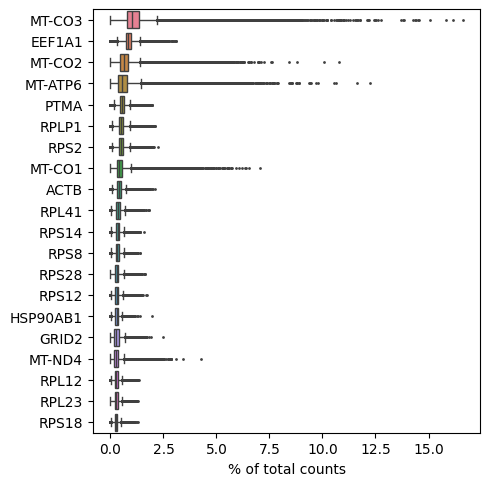

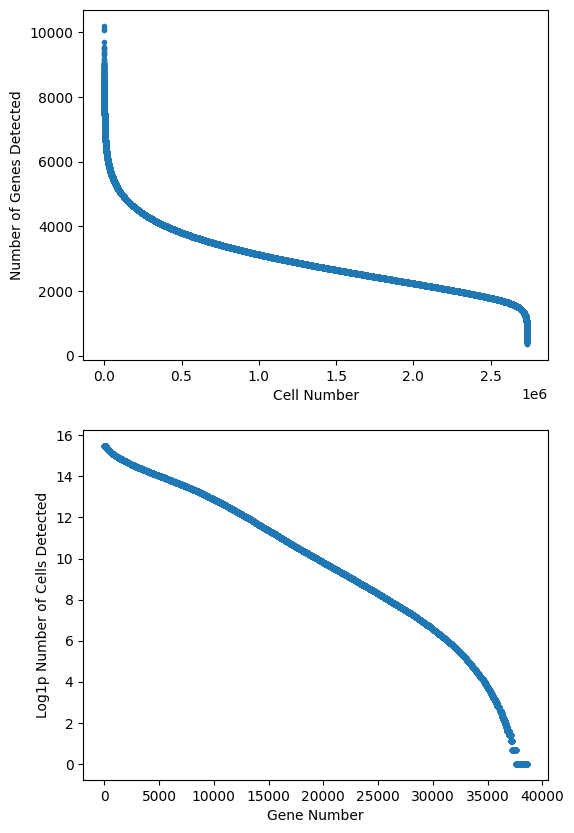

Removing 1039 genes not detected in any cells.


In [7]:
adata = qc.general_qc(adata)

Perform QC with automatic thresholding based on median absolute deviations (MADs) for log1p_total_counts, lop1p_n_genes_by_counts, pct_counts_in_top_20_genes, and pct_counts_mt using scanpy's calculate_qc_metrics() with cumulative proportion to the 20th most expressed gene (percent_top=[20]).

Sept 7 2025: With the 3 MAD dataset, there were issues with Step F (isolating perturbed cells), specifically fitting a gamma distribution to the energy distance statistical testing results. This may be due to the QC filtering being too strict. Now we will try 3 count MADs and 5 mitochondrial MADs.

/home/ranwyl/data_tf_project/perturb_seq_heuristic_pipeline.py:201: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.


outlier
False    2502888
True      232562
Name: count, dtype: int64

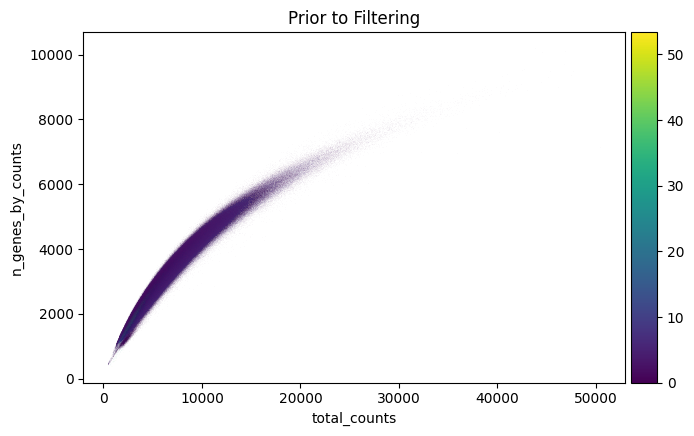

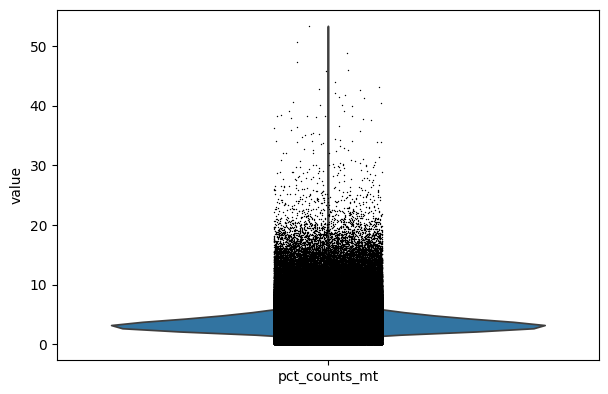

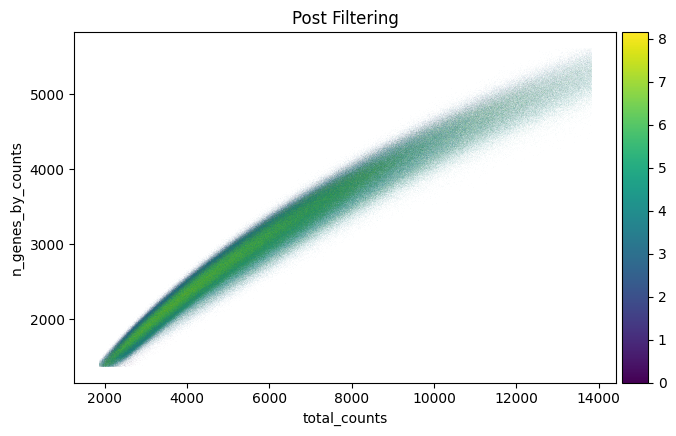

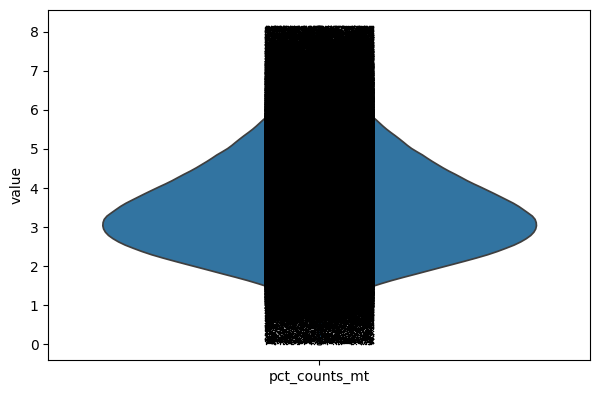

In [8]:
adata35 = qc.dead_cell_qc(adata, count_MADs=3, mt_MADs=5, ribo_MADs=5)

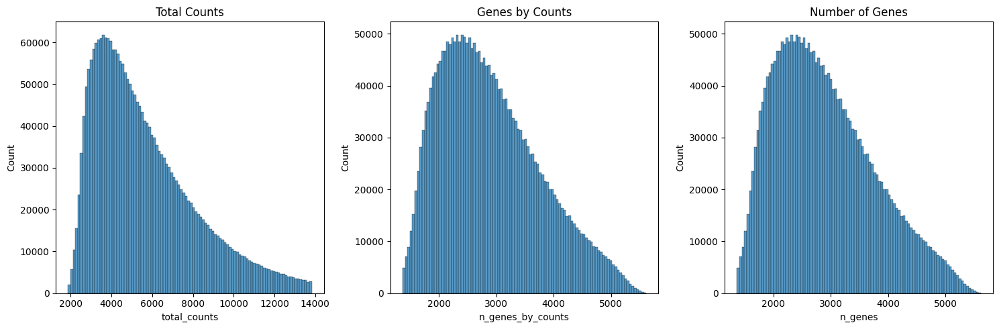

In [9]:
qc.doublet_detection_sanity_check(adata35)

In [10]:
adata35.write("/home/ranwyl/data_tf_project/Aggregate_Basic_QC_Cell_QC.h5ad")

### Step C old (5 MADs for all QC metrics and 3 MADs for all QC metrics)

QC with 5 MADs (before Sept 1 2025) - consistent with Nourreddine et al

/home/ranwyl/data_tf_project/perturb_seq_heuristic_pipeline.py:201: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.


outlier
False    2663490
True       71960
Name: count, dtype: int64

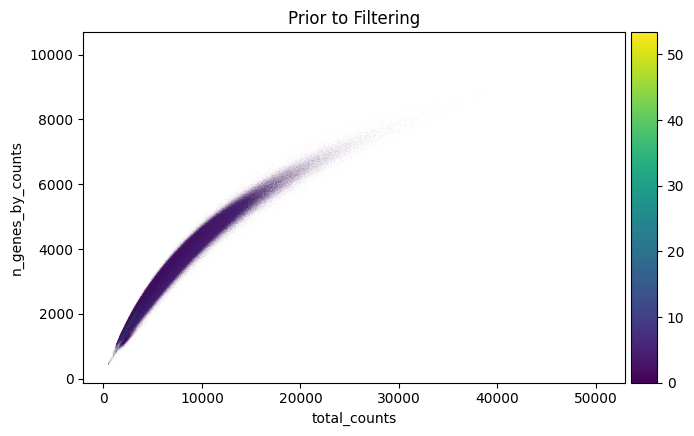

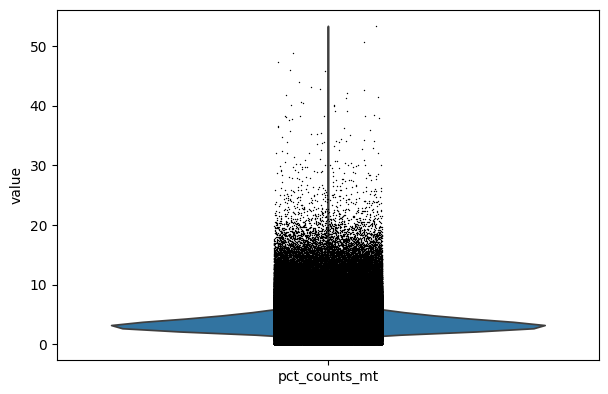

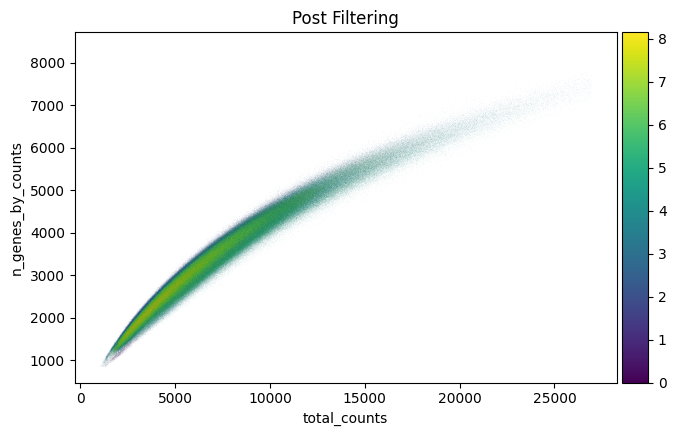

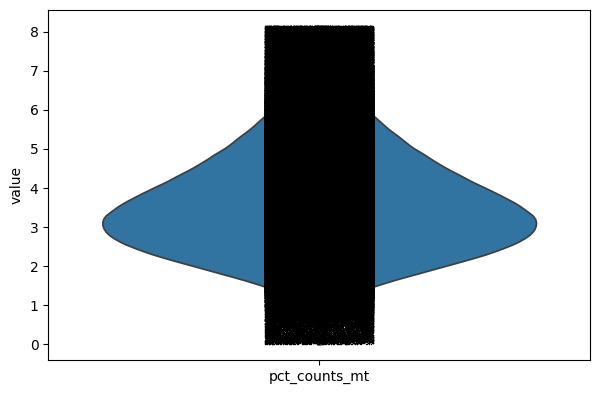

In [ ]:
adata_5_mads = qc.dead_cell_qc(adata, count_MADs=5, mt_MADs=5, ribo_MADs=5)

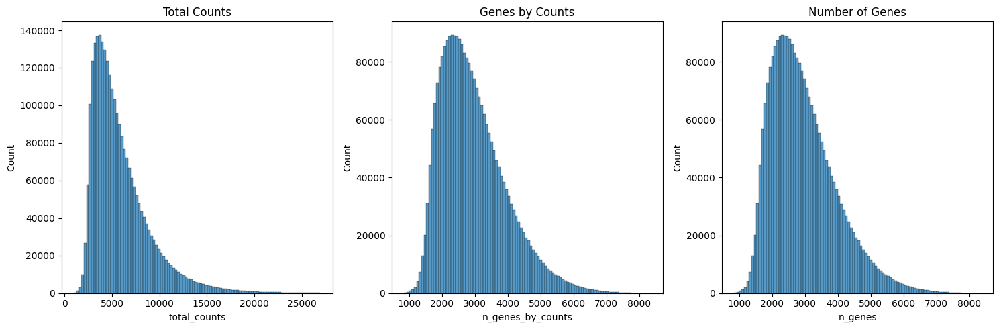

In [ ]:
qc.doublet_detection_sanity_check(adata_5_mads)

Sept 1 2025: Because there are still some cells with a high (>5000) number of expressed genes, indicating that there are still doublets in the dataset, we will instead perform cell-level QC with a stricter threshold of 3 MADs for counts, percent mitochondrial genes, and percent ribosomal genes

/home/ranwyl/data_tf_project/perturb_seq_heuristic_pipeline.py:201: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.


outlier
False    2320434
True      415016
Name: count, dtype: int64

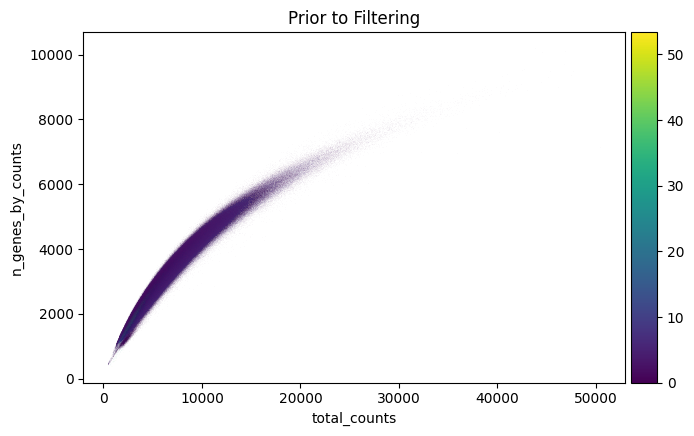

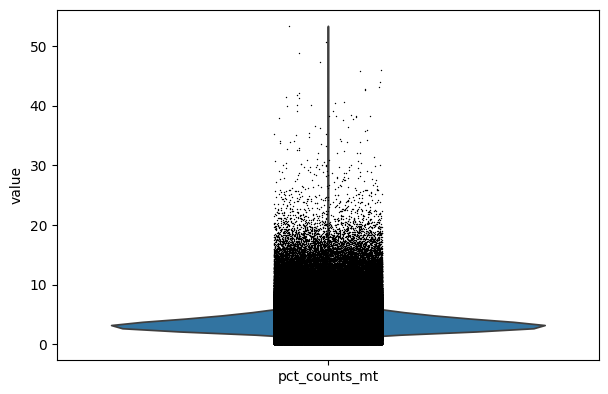

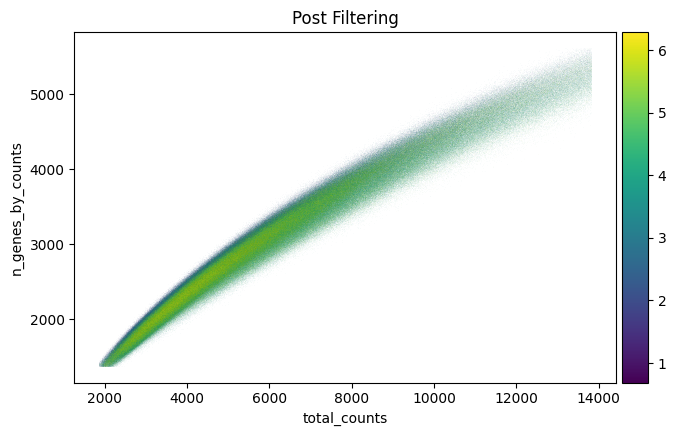

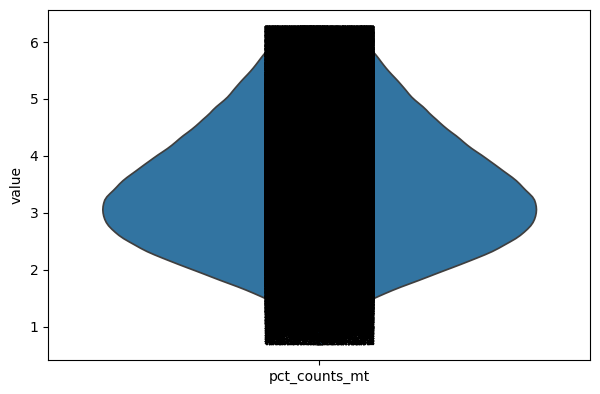

In [7]:
adata_3_mads = qc.dead_cell_qc(adata, count_MADs=3, mt_MADs=3, ribo_MADs=3)

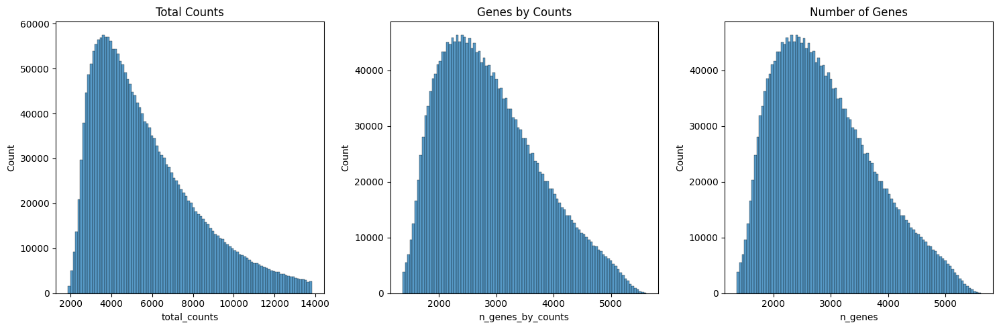

In [8]:
qc.doublet_detection_sanity_check(adata_3_mads)

Save the intermediate file:

In [ ]:
# Renamed to old_3MADs_Aggregate_Basic_QC_Cell_QC.h5ad
adata_3_mads.write("/home/ranwyl/data_tf_project/Aggregate_Basic_QC_Cell_QC.h5ad")

Intermediate files where QC was performed with 5 MADs have been renamed by prepending each filename with old_5MADs_

## Step D: Isolating Core NTC Cells 

Read in QC-passed data:

In [2]:
adata = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_Basic_QC_Cell_QC.h5ad")

In [11]:
adata

AnnData object with n_obs × n_vars = 2502888 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

Save raw counts and create `run` metadata column in `obs`:

In [3]:
adata.layers["counts"] = adata.X.copy()
adata.obs["run"] = [label.split('-')[0] for label in adata.obs.channel]

Filter NTC cells based on provided whitelist:

In [4]:
whitelist_filepath = "/home/ranwyl/data_tf_project/NTC_sgRNA_whitelist.txt"
with open(whitelist_filepath, 'r') as f:
  sgRNA_whitelist = f.read().splitlines()
ntc_adata = qc2._get_ntc_view(adata)
ntc_adata = ntc_adata[ntc_adata.obs.gRNA.isin(sgRNA_whitelist)].copy()
ntc_adata

AnnData object with n_obs × n_vars = 50328 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

Use isolation forest with 30% contamination fraction to isolate core NTC cells. Use modified version of scrub_ntc() that uses a seeded random number generator for the isolation forest model.

Initial number of NTC Cells: 50328
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    341 total control genes are used. (0:00:01)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    301 total control genes are used. (0:00:01)
-->     'phase', cell cycle phase (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:06)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adat

  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:30)


/home/ranwyl/pymde_env/lib64/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


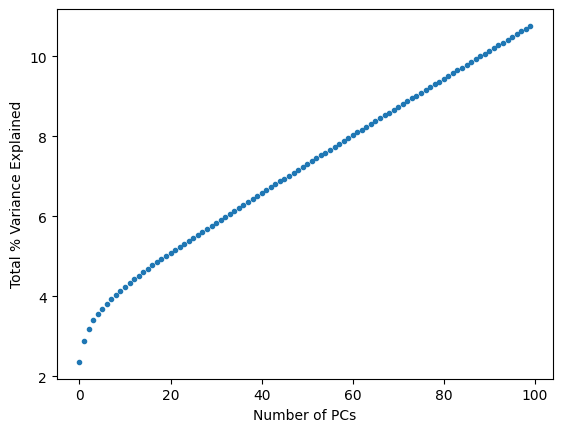

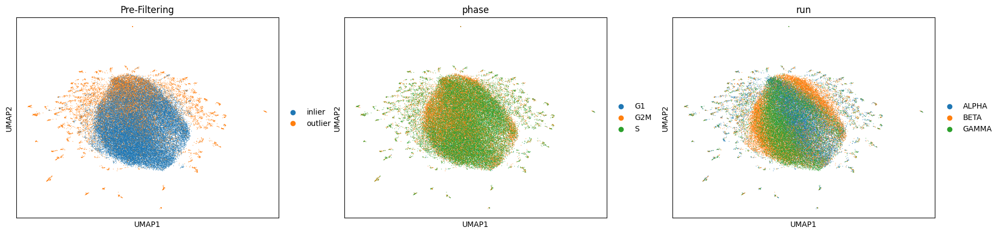

computing density on 'umap'
--> added
    'umap_density', densities (adata.obs)
    'umap_density_params', parameter (adata.uns)


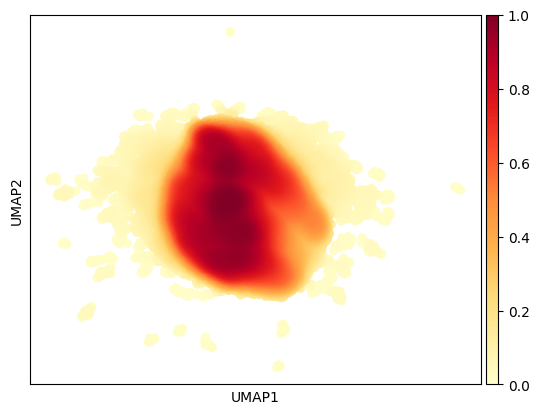

computing neighbors
        initialized `.distances` `.connectivities` 
    computing neighbors
    computed neighbors (0:00:01)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:29)
computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:21)


/home/ranwyl/pymde_env/lib64/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


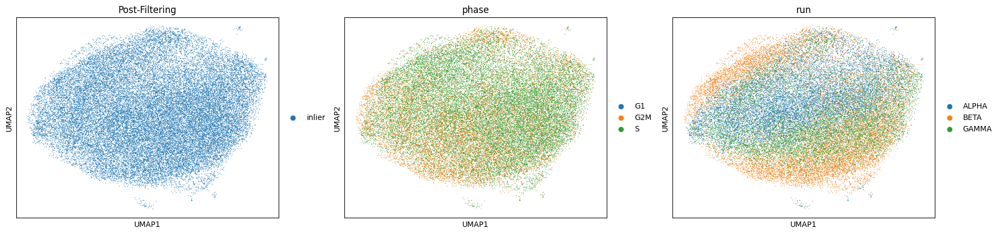

computing density on 'umap'
--> added
    'umap_density', densities (adata.obs)
    'umap_density_params', parameter (adata.uns)


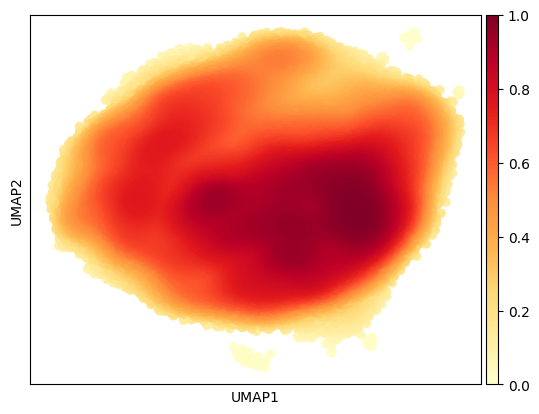

In [5]:
ntc_adata = ntc_adata[ntc_adata.obs.index.isin(qc2.scrub_ntc_random_seed(ntc_adata))]

In [6]:
ntc_adata

View of AnnData object with n_obs × n_vars = 35229 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'S_score', 'G2M_score', 'phase', 'is_outlier', 'umap_density'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'umap', 'is_outlier_colors', 'phase_colo

In [7]:
ntc_adata.obs.run.value_counts()

run
ALPHA    13495
BETA     12572
GAMMA     9162
Name: count, dtype: int64

We have now isolated the core NTC cells. We will subset `adata` to only include perturbed cells and the core NTC cells.

In [8]:
perturbed_mask = adata.obs.perturbed == "True"
valid_ntc_mask = adata.obs.index.isin(ntc_adata.obs.index)
adata_step_d = adata[perturbed_mask | valid_ntc_mask,:].copy()

In [9]:
adata_step_d

AnnData object with n_obs × n_vars = 2399843 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

Save the file:

In [10]:
adata_step_d.write("/home/ranwyl/data_tf_project/Aggregate_Core_NTC.h5ad")

## Post step D/pre step E - generate plots and separate batches

Load in data:

In [2]:
adata = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_Core_NTC.h5ad")

Check that the number of NTC cells is correct:

In [3]:
adata[adata.obs["perturbed"] == "False"]

View of AnnData object with n_obs × n_vars = 35229 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

Plot cells per perturbation:

10161/11739 (86.56)% Perturbations have > 100 cells


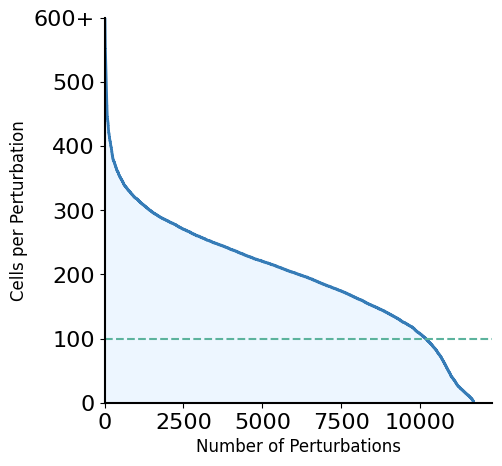

In [4]:
f = qc2.plot_cells_per_perturbation(adata)

Plot UMIs per cell:

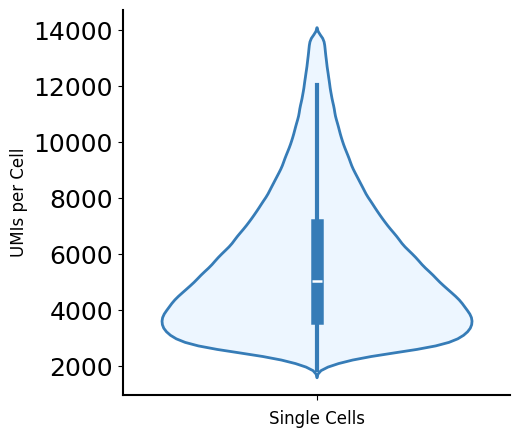

In [5]:
f = qc2.plot_umis_per_cell(adata)

Assign more metadata:

In [6]:
gene_id_file_path = "/home/ranwyl/data_tf_project/gene_ids.txt"
qc2.assign_gene_ids(adata, gene_id_file_path)
adata = qc2.remove_invalid_gene_targets_in_place(adata,obs_key="gene_target_ensembl_id",var_key="gene_ids")

  - ENSG00000234414
  - ENSG00000251380
  - ENSG00000182415
  - ENSG00000172288
  - ENSG00000262664
  - ENSG00000129864
  - ENSG00000268994
  - ENSG00000286190
  - ENSG00000253797


Split by run and save intermediate files:

In [7]:
adata_alpha = adata[adata.obs.run=="ALPHA"].copy()
adata_alpha.write("/home/ranwyl/data_tf_project/Aggregate_ALPHA.h5ad")

In [8]:
adata_beta = adata[adata.obs.run=="BETA"].copy()
adata_beta.write("/home/ranwyl/data_tf_project/Aggregate_BETA.h5ad")

In [9]:
adata_gamma = adata[adata.obs.run=="GAMMA"].copy()
adata_gamma.write("/home/ranwyl/data_tf_project/Aggregate_GAMMA.h5ad")

## Step E: Isolating effective sgRNA

In this step, we will normalize counts per cell to 1M, remove sgRNA that do not induce mean >30% on-target knockdown, and remove unrepressed cells and sgRNA without at least 25 associated cells. We will read in each dataset and perform the knockdown QC one at a time.

Perform knockdown QC:

normalizing counts per cell
    finished (0:00:08)
8185 out of 11298 (72.45%) non-NTC sgRNAs have more than 30% knockdown.


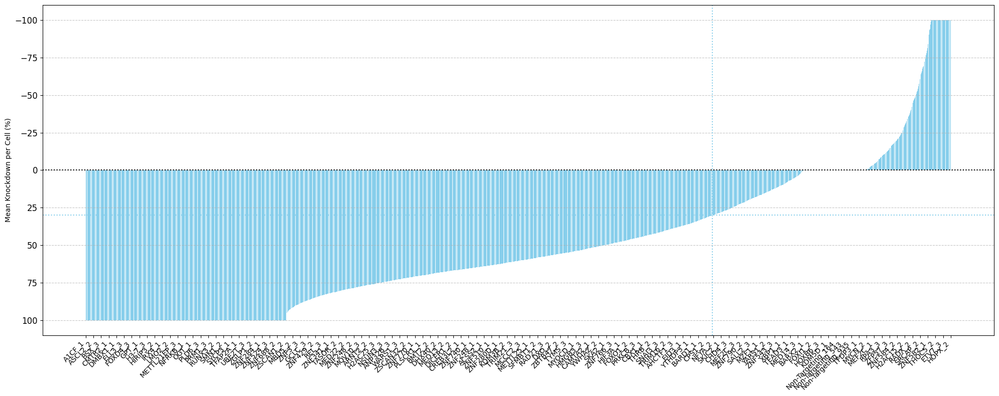

Removing 2877 perturbing sgRNA for not having more than 30% knockdown
Before filter: 11301,perturbed
True     840039
False     13495
Name: count, dtype: int64
After filter: 8424,perturbed
True     627014
False     13495
Name: count, dtype: int64
Removing 38119 perturbed cells for not having any measureable repression.
Before filter: 8424,perturbed
True     627014
False     13495
Name: count, dtype: int64
After filter: 8424,perturbed
True     588895
False     13495
Name: count, dtype: int64


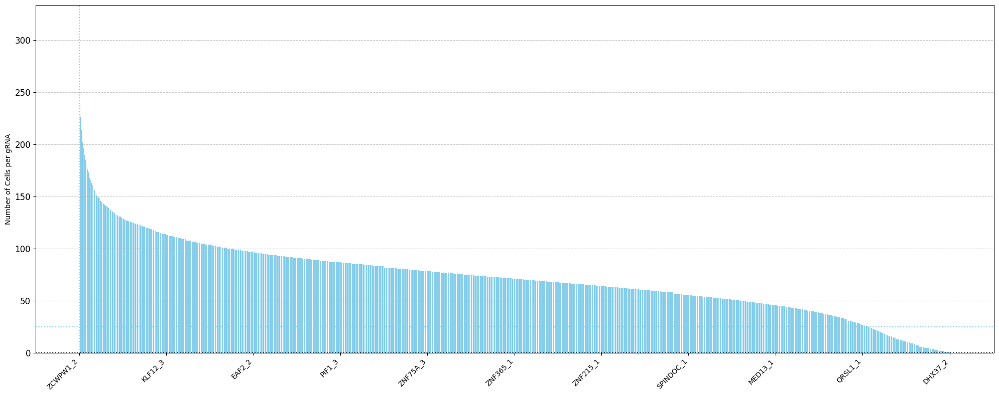

Before filter: 8424,perturbed
True     588895
False     13495
Name: count, dtype: int64
Removing 775 perturbing sgRNA for not having more than 25 cells
After filter: 7649,perturbed
True     580639
False     13495
Name: count, dtype: int64


In [3]:
adata_alpha = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_ALPHA.h5ad")
knockdown_adata_alpha = qc2.knockdown_qc(adata_alpha, 'gene_target_ensembl_id', 'gene_ids').copy()

normalizing counts per cell
    finished (0:00:12)
9840 out of 12153 (80.97%) non-NTC sgRNAs have more than 30% knockdown.


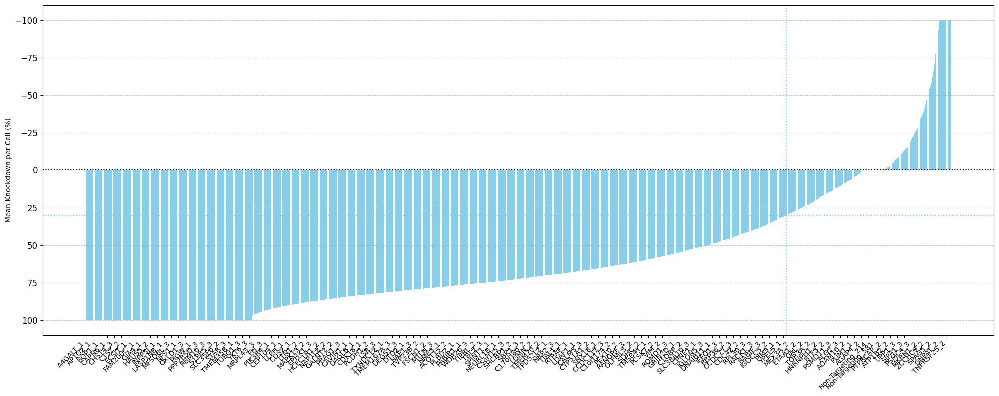

Removing 2077 perturbing sgRNA for not having more than 30% knockdown
Before filter: 12153,perturbed
True     884112
False     12572
Name: count, dtype: int64
After filter: 10076,perturbed
True     754906
False     12572
Name: count, dtype: int64
Removing 39519 perturbed cells for not having any measureable repression.
Before filter: 10076,perturbed
True     754906
False     12572
Name: count, dtype: int64
After filter: 10076,perturbed
True     715387
False     12572
Name: count, dtype: int64


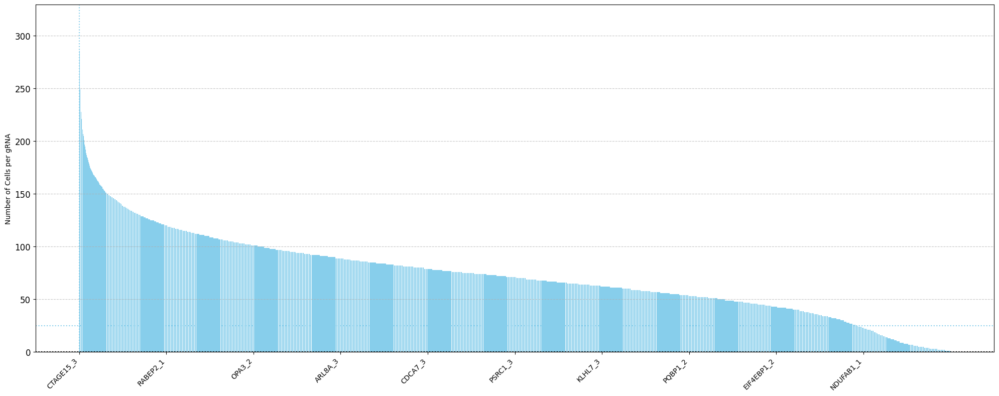

Before filter: 10076,perturbed
True     715387
False     12572
Name: count, dtype: int64
Removing 1070 perturbing sgRNA for not having more than 25 cells
After filter: 9006,perturbed
True     704086
False     12572
Name: count, dtype: int64


In [2]:
adata_beta = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_BETA.h5ad")
knockdown_adata_beta = qc2.knockdown_qc(adata_beta, 'gene_target_ensembl_id', 'gene_ids').copy()

normalizing counts per cell
    finished (0:00:07)
9909 out of 11997 (82.60%) non-NTC sgRNAs have more than 30% knockdown.


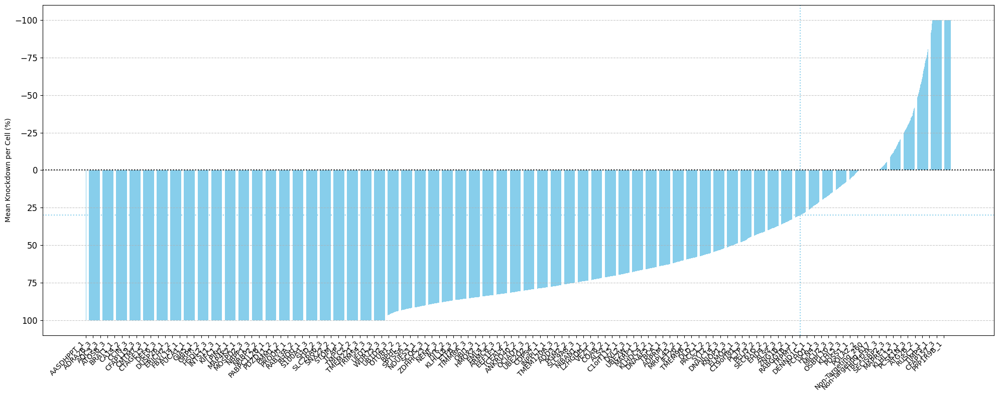

Removing 1853 perturbing sgRNA for not having more than 30% knockdown
Before filter: 11997,perturbed
True     638621
False      9162
Name: count, dtype: int64
After filter: 10144,perturbed
True     542392
False      9162
Name: count, dtype: int64
Removing 22335 perturbed cells for not having any measureable repression.
Before filter: 10144,perturbed
True     542392
False      9162
Name: count, dtype: int64
After filter: 10144,perturbed
True     520057
False      9162
Name: count, dtype: int64


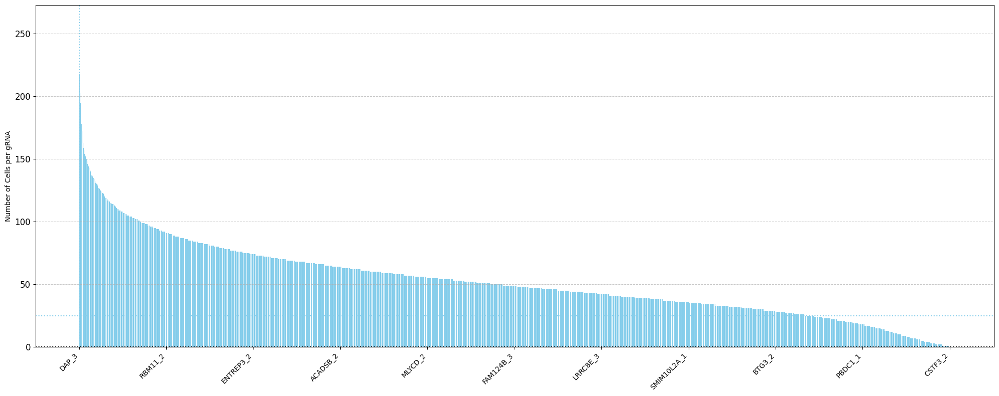

Before filter: 10144,perturbed
True     520057
False      9162
Name: count, dtype: int64
Removing 1650 perturbing sgRNA for not having more than 25 cells
After filter: 8494,perturbed
True     497154
False      9162
Name: count, dtype: int64


In [4]:
adata_gamma = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_GAMMA.h5ad")
knockdown_adata_gamma = qc2.knockdown_qc(adata_gamma, 'gene_target_ensembl_id', 'gene_ids').copy()

9581/11739 (0.8161683277962348) Perturbations achieve > 30% Knockdown


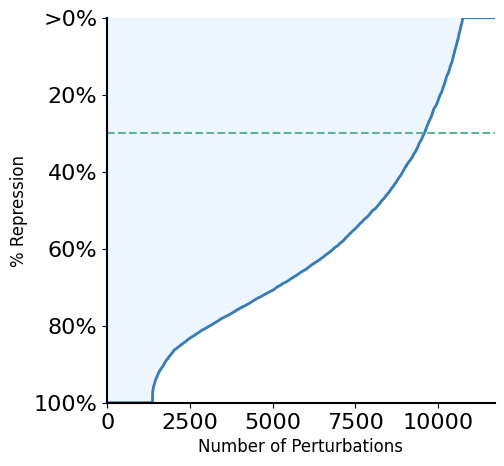

In [5]:
alpha_knockdown = list(qc2._get_perturbed_view(adata_alpha).obs.groupby("gene_target")["target_knockdown"].mean())
beta_knockdown = list(qc2._get_perturbed_view(adata_beta).obs.groupby("gene_target")["target_knockdown"].mean())
gamma_knockdown = list(qc2._get_perturbed_view(adata_gamma).obs.groupby("gene_target")["target_knockdown"].mean())
total_knockdown = np.sort(np.clip(np.array(alpha_knockdown + beta_knockdown + gamma_knockdown),a_min=0,a_max=1))[::-1]
f = qc2.plot_percentage_perturbations_by_repression(total_knockdown)

Calculate median NTC number of UMI counts:

In [6]:
median_NTC = np.median(list(qc2._get_ntc_view(knockdown_adata_alpha).obs.n_UMI_counts) 
                       + list(qc2._get_ntc_view(knockdown_adata_beta).obs.n_UMI_counts) 
                       + list(qc2._get_ntc_view(knockdown_adata_gamma).obs.n_UMI_counts))
print(median_NTC)

4542.0


Normalize, log1p transform, and scale data with target sum `median_NTC`, one dataset at a time.

ALPHA:

In [7]:
sc.pp.normalize_total(knockdown_adata_alpha,target_sum=median_NTC)
sc.pp.log1p(knockdown_adata_alpha)
sc.pp.scale(knockdown_adata_alpha)

normalizing counts per cell
    finished (0:00:18)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [8]:
knockdown_adata_alpha.write("/home/ranwyl/data_tf_project/step_E_output_ALPHA.h5ad")

In [9]:
del knockdown_adata_alpha
gc.collect()

1471046

BETA:

In [10]:
sc.pp.normalize_total(knockdown_adata_beta,target_sum=median_NTC)
sc.pp.log1p(knockdown_adata_beta)
sc.pp.scale(knockdown_adata_beta)

normalizing counts per cell


    finished (0:00:07)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [11]:
knockdown_adata_beta.write("/home/ranwyl/data_tf_project/step_E_output_BETA.h5ad")

In [12]:
del knockdown_adata_beta
gc.collect()

900

GAMMA:

In [13]:
sc.pp.normalize_total(knockdown_adata_gamma,target_sum=median_NTC)
sc.pp.log1p(knockdown_adata_gamma)
sc.pp.scale(knockdown_adata_gamma)

normalizing counts per cell
    finished (0:00:05)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [14]:
knockdown_adata_gamma.write("/home/ranwyl/data_tf_project/step_E_output_GAMMA.h5ad")

Restart kernel

## Step F: Isolate sgRNA altering cell state and isolate perturbed cells

First we perform sgRNA-level energy distance-based filtering on each of the 3 data subsets.

In [2]:
# Settings for parallel processing with tqdm_joblib
os.environ["OMP_NUM_THREADS"] = "1"
os.environ["OMP_MAX_ACTIVE_LEVELS"] = "1"
os.environ["KMP_WARNINGS"] = "0"  # For Intel's OpenMP implementation

ALPHA:

In [3]:
knockdown_adata_alpha = ad.read_h5ad("/home/ranwyl/data_tf_project/step_E_output_ALPHA.h5ad")

In [4]:
knockdown_adata_alpha

AnnData object with n_obs × n_vars = 594134 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mean', 'std'
    uns: 'log1p'
    layers: 'counts', 'normalized_counts'

In [5]:
knockdown_adata_alpha.obs.perturbed.value_counts()

perturbed
True     580639
False     13495
Name: count, dtype: int64

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:11)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:18)
    computed connectivities (0:00:11)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:30)


Computing null distribution:   0%|          | 0/20 [00:00<?, ?it/s]

Computing group distances:   0%|          | 0/7414 [00:00<?, ?it/s]

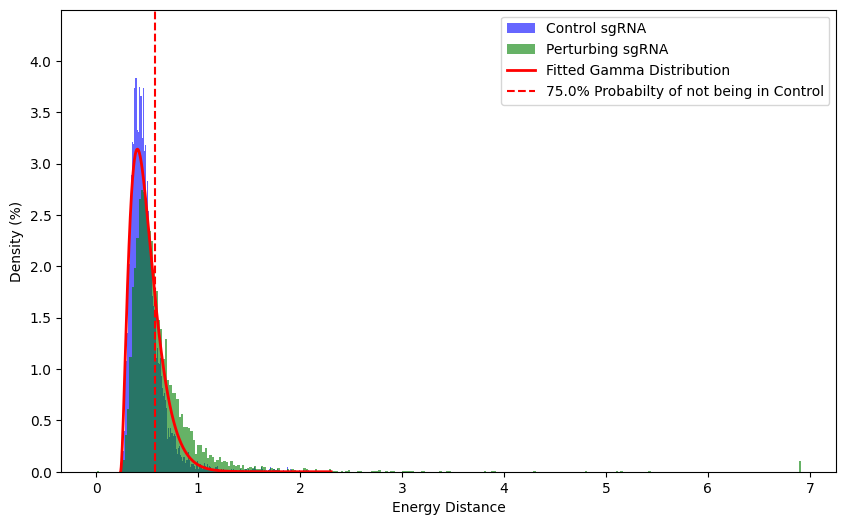

3133/7414 Perturbing sgRNA cross threshold of 0.75


In [6]:
alpha_filtered, alpha_null_distances, alpha_results = qc2.filter_sgRNA_random_seed(knockdown_adata_alpha)

In [7]:
alpha_filtered = alpha_filtered.copy()

In [8]:
alpha_filtered.write("/home/ranwyl/data_tf_project/Aggregate_ALPHA_sgRNA_Filtered.h5ad")

BETA:

In [3]:
knockdown_adata_beta = ad.read_h5ad("/home/ranwyl/data_tf_project/step_E_output_BETA.h5ad")

In [4]:
knockdown_adata_beta

AnnData object with n_obs × n_vars = 716658 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mean', 'std'
    uns: 'log1p'
    layers: 'counts', 'normalized_counts'

In [5]:
knockdown_adata_beta.obs.perturbed.value_counts()

perturbed
True     704086
False     12572
Name: count, dtype: int64

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:10)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:20)
    computed connectivities (0:00:12)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:33)


Computing null distribution:   0%|          | 0/20 [00:00<?, ?it/s]

Computing group distances:   0%|          | 0/8771 [00:00<?, ?it/s]

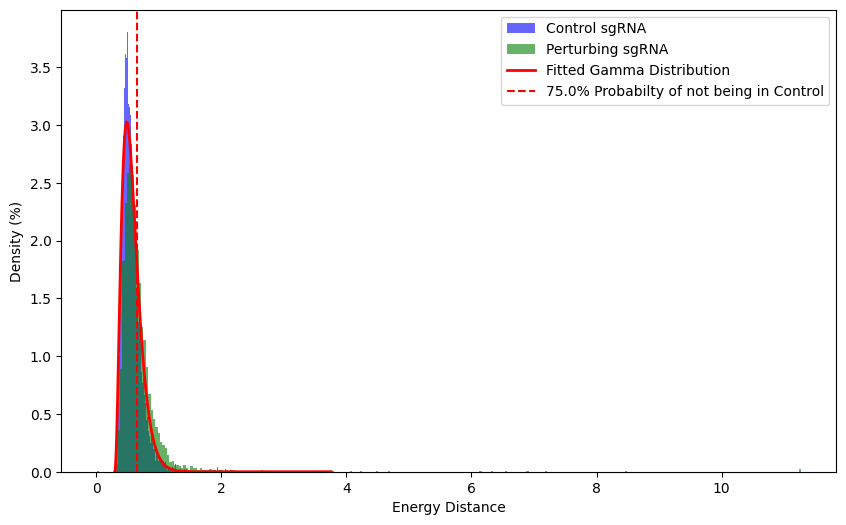

3437/8771 Perturbing sgRNA cross threshold of 0.75


In [6]:
beta_filtered, beta_null_distances, beta_results = qc2.filter_sgRNA_random_seed(knockdown_adata_beta)

In [7]:
beta_filtered = beta_filtered.copy()

In [8]:
beta_filtered.write("/home/ranwyl/data_tf_project/Aggregate_BETA_sgRNA_Filtered.h5ad")

GAMMA:

In [3]:
knockdown_adata_gamma = ad.read_h5ad("/home/ranwyl/data_tf_project/step_E_output_GAMMA.h5ad")

In [4]:
knockdown_adata_gamma

AnnData object with n_obs × n_vars = 506316 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mean', 'std'
    uns: 'log1p'
    layers: 'counts', 'normalized_counts'

In [5]:
knockdown_adata_gamma.obs.perturbed.value_counts()

perturbed
True     497154
False      9162
Name: count, dtype: int64

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:09)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:20)
    computed connectivities (0:00:12)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:32)


Computing null distribution:   0%|          | 0/20 [00:00<?, ?it/s]

Computing group distances:   0%|          | 0/8260 [00:00<?, ?it/s]

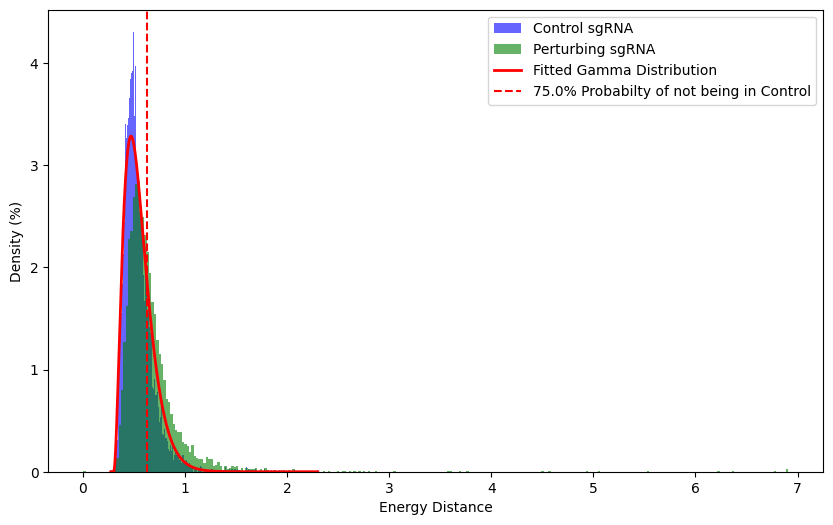

3538/8260 Perturbing sgRNA cross threshold of 0.75


In [6]:
gamma_filtered, gamma_null_distances, gamma_results = qc2.filter_sgRNA_random_seed(knockdown_adata_gamma)

In [7]:
gamma_filtered = gamma_filtered.copy()

In [8]:
gamma_filtered.write("/home/ranwyl/data_tf_project/Aggregate_GAMMA_sgRNA_Filtered.h5ad")

Next, we remove unperturbed cells one data subset at a time.

ALPHA:

In [2]:
adata_alpha = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_ALPHA_sgRNA_Filtered.h5ad")

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:02)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:16)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


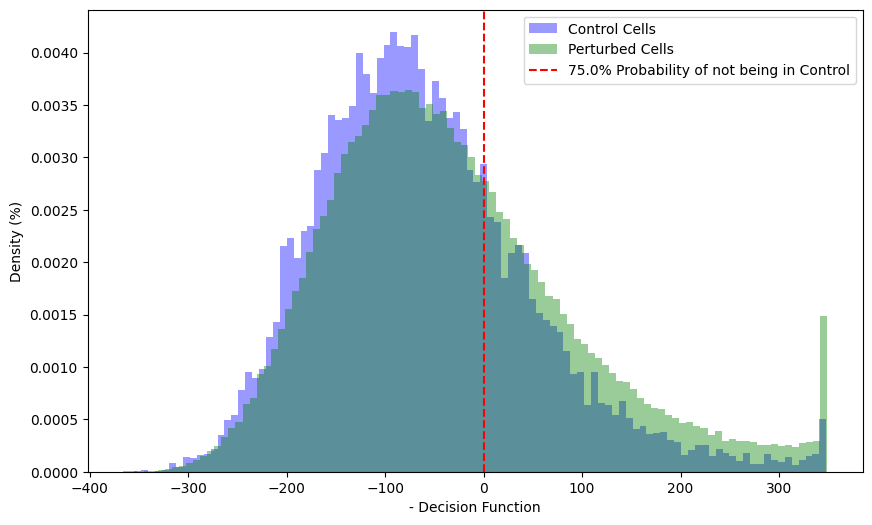

79564/237919 Perturbed Cells cross threshold of 0.75


In [3]:
adata_alpha_filtered, c, p = qc2.remove_unperturbed_cells(adata_alpha, threshold=0.75)

In [4]:
perturbation_counts = dict(adata_alpha_filtered.obs.gene_target.value_counts())
remaining_perturbations = [k for k,v in perturbation_counts.items() if v >= 25]
print(len(remaining_perturbations),remaining_perturbations)

1424 ['NTC', 'HNF4A', 'LRPPRC', 'ZFP37', 'TAF6L', 'DNMT1', 'CHAMP1', 'HNF1B', 'EHMT1', 'EMSY', 'ZNF354A', 'MEIS3', 'ZFP41', 'POGZ', 'PNPT1', 'CREB3L3', 'CABIN1', 'PCGF1', 'TBXT', 'TADA3', 'INTS12', 'RNASEH1', 'KDM5C', 'FOXH1', 'DHX36', 'TSHZ1', 'ZSCAN18', 'RLIM', 'EHMT2', 'ALKBH1', 'SMARCC1', 'PLD4', 'TFAM', 'ZNF662', 'DDX6', 'UHRF1', 'SPI1', 'ZNF318', 'EBF2', 'SLX1A', 'ZNF787', 'ZNF594', 'HEY2', 'NR5A1', 'SIN3B', 'FOXS1', 'POU5F1', 'KAT2A', 'BMAL2', 'ZNF219', 'ZNF462', 'YTHDC2', 'SOX4', 'MTA1', 'MAFG', 'MED19', 'ZNF683', 'ZNF528', 'ACTB', 'ZNF273', 'SMARCE1', 'LEMD3', 'ZSCAN9', 'POLRMT', 'PITX3', 'DHX40', 'MTA2', 'SMAD9', 'PWWP2B', 'ZNF280D', 'BHLHE40', 'LYL1', 'SGF29', 'ZNF419', 'SKP2', 'RPS6KA4', 'IRX1', 'OVOL1', 'NABP2', 'H2BC14', 'PAX2', 'ZNF41', 'RCOR2', 'SUZ12', 'NANOG', 'SCX', 'SSBP1', 'KIF4B', 'BRD1', 'ERVK3-1', 'ARHGAP35', 'ZNF836', 'RBPJ', 'REL', 'SIX6', 'ISL1', 'DMBX1', 'KMT2E', 'TRIM37', 'THAP12', 'SETDB1', 'ZNF732', 'CDK13', 'HFM1', 'KMT2D', 'CCNC', 'FOXG1', 'HNRNPAB', 'Z

In [5]:
adata_alpha_filtered = qc2.remove_perturbations_by_cell_threshold(adata_alpha_filtered)

Removing 735 perturbations for having under 25 cells.


In [6]:
adata_alpha_filtered

AnnData object with n_obs × n_vars = 80051 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mean', 'std', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: '

In [7]:
adata_alpha_filtered.write("/home/ranwyl/data_tf_project/Aggregate_ALPHA_Core_Cells.h5ad")

BETA:

In [2]:
adata_beta = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_BETA_sgRNA_Filtered.h5ad")

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:03)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:16)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


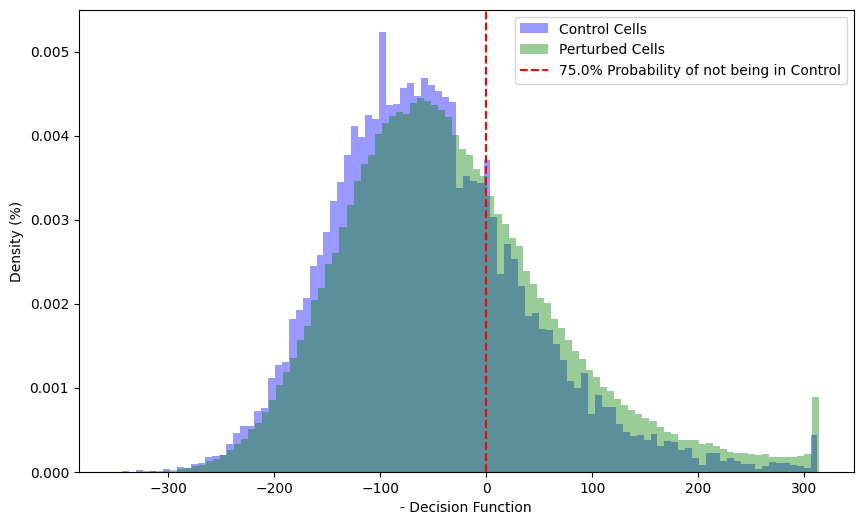

84800/267414 Perturbed Cells cross threshold of 0.75


In [3]:
adata_beta_filtered, c, p = qc2.remove_unperturbed_cells(adata_beta, threshold=0.75)

In [4]:
perturbation_counts = dict(adata_beta_filtered.obs.gene_target.value_counts())
remaining_perturbations = [k for k,v in perturbation_counts.items() if v >= 25]
print(len(remaining_perturbations),remaining_perturbations)

1499 ['NTC', 'SCAF4', 'FBXO45', 'BBC3', 'CASP6', 'HCCS', 'LRCH4', 'VHL', 'VPS33A', 'TESK1', 'UBL7', 'METRN', 'UBE2M', 'UBFD1', 'SERPINB9', 'LATS2', 'SLC30A1', 'NAE1', 'CCDC6', 'LIMK1', 'HRH3', 'IGF2R', 'CYCS', 'B3GALT6', 'CTAGE15', 'TTC14', 'LANCL1', 'LAMTOR1', 'FBXW5', 'GOLGA5', 'SBF1', 'NIF3L1', 'TBRG4', 'TMEM216', 'SLC11A2', 'POFUT1', 'PGM1', 'ITPRIPL1', 'LAMTOR5', 'AKAP17A', 'FZD9', 'CKS1B', 'PRUNE1', 'MICALL1', 'CANT1', 'TMUB1', 'TEFM', 'FASTKD5', 'SERF1B', 'MRPL36', 'KLHDC8B', 'NUDT12', 'AP3M1', 'CDK5R1', 'IGFBP6', 'NDUFB9', 'HMBS', 'BEX3', 'VPS39', 'ARL6IP4', 'SH3BGRL3', 'MMD', 'MRPL11', 'IKBIP', 'SMIM3', 'DEXI', 'RNPEPL1', 'CCDC8', 'EEF1B2', 'CRTAP', 'LGMN', 'RAB5C', 'IER3IP1', 'PTPN1', 'BRICD5', 'IFFO1', 'HNRNPM', 'MTRES1', 'EXT2', 'WBP1', 'KCNE3', 'C21orf91', 'RAB3GAP2', 'TMX2', 'MRPS16', 'ETNK2', 'PPP1R14B', 'DSTN', 'MTFMT', 'TMEM223', 'GNA13', 'FKBP2', 'MAP3K4', 'MITD1', 'OLFML3', 'UQCC3', 'REEP4', 'ARL4D', 'PLCD3', 'MRPL10', 'DOLPP1', 'GRIK5', 'UBB', 'TOE1', 'TP53I11', 'MS

In [5]:
adata_beta_filtered = qc2.remove_perturbations_by_cell_threshold(adata_beta_filtered)

Removing 904 perturbations for having under 25 cells.


In [6]:
adata_beta_filtered

AnnData object with n_obs × n_vars = 81849 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mean', 'std', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: '

In [7]:
adata_beta_filtered.write("/home/ranwyl/data_tf_project/Aggregate_BETA_Core_Cells.h5ad")

GAMMA:

In [2]:
adata_gamma = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_GAMMA_sgRNA_Filtered.h5ad")

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:02)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:11)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


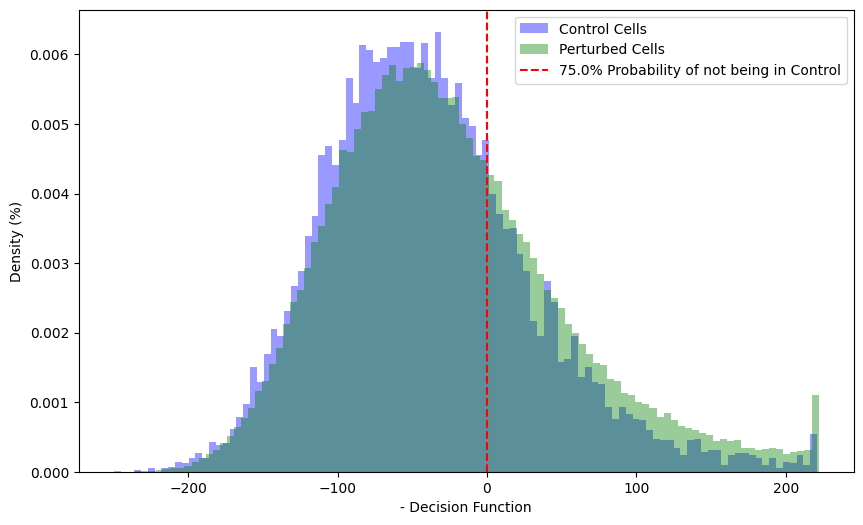

64826/207611 Perturbed Cells cross threshold of 0.75


In [3]:
adata_gamma_filtered, c, p = qc2.remove_unperturbed_cells(adata_gamma, threshold=0.75)

In [4]:
perturbation_counts = dict(adata_gamma_filtered.obs.gene_target.value_counts())
remaining_perturbations = [k for k,v in perturbation_counts.items() if v >= 25]
print(len(remaining_perturbations),remaining_perturbations)

1072 ['NTC', 'SUPT20H', 'FLYWCH2', 'ABCD1', 'NOMO1', 'NPIPA3', 'BTBD10', 'HS2ST1', 'RASA4', 'SPHK1', 'RNF144A', 'LHFPL2', 'ANOS1', 'CTDSPL', 'FLCN', 'PABPC1L2B', 'STOML1', 'PDF', 'RSAD1', 'TIMM50', 'FECH', 'TMEM151B', 'SCAF8', 'BAK1', 'NF2', 'S1PR2', 'CEP43', 'NPEPPS', 'IL6ST', 'FBXO31', 'TMEM187', 'GJB5', 'TGFBR2', 'GOLM2', 'C15orf61', 'HLA-A', 'CLDN1', 'SLC17A5', 'SCARF1', 'HID1', 'CTRL', 'SLC29A2', 'HIPK2', 'FBXO42', 'PLTP', 'MMP16', 'PIGC', 'CNST', 'STK10', 'NEO1', 'SLC4A1AP', 'CCDC160', 'CES3', 'IKBKG', 'KIF17', 'TRIM65', 'ARHGEF10L', 'ADAMTS13', 'IFT22', 'AMER1', 'GOLPH3L', 'LRRC45', 'CAMK2N2', 'EIF4ENIF1', 'RGS11', 'LPGAT1', 'PMM1', 'ZDHHC24', 'QTRT2', 'STK38L', 'GDAP1', 'SLC2A10', 'CYFIP2', 'USP45', 'ISCA2', 'PCTP', 'PRRT3', 'POMT2', 'DNAL4', 'AKAP9', 'ADCY2', 'BSPRY', 'SH3D19', 'HBEGF', 'SAMHD1', 'ANKRD16', 'RNF175', 'PARD6G', 'PEX11A', 'KCNC4', 'TCL1A', 'CFAP418', 'NRBP1', 'UBE3B', 'ASPH', 'PLAAT3', 'C18orf54', 'TPBGL', 'LRRC32', 'TGFBR1', 'MTRFR', 'MTPAP', 'DFFA', 'LDOC1', '

In [5]:
adata_gamma_filtered = qc2.remove_perturbations_by_cell_threshold(adata_gamma_filtered)

Removing 1425 perturbations for having under 25 cells.


In [6]:
adata_gamma_filtered

AnnData object with n_obs × n_vars = 52500 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mean', 'std', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: '

In [7]:
adata_gamma_filtered.write("/home/ranwyl/data_tf_project/Aggregate_GAMMA_Core_Cells.h5ad")

### Step F old (different cell-level QC and/or no random seed)

**Dataset: 5 MADs**

ALPHA

/home/ranwyl/data_tf_project/pan_genome_analysis_functions.py:519: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
computing PCA
    with n_comps=50
    finished (0:00:19)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:36)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:39)


Computing null distribution:   0%|          | 0/10000 [00:00<?, ?it/s]

Computing group distances:   0%|          | 0/7442 [00:00<?, ?it/s]

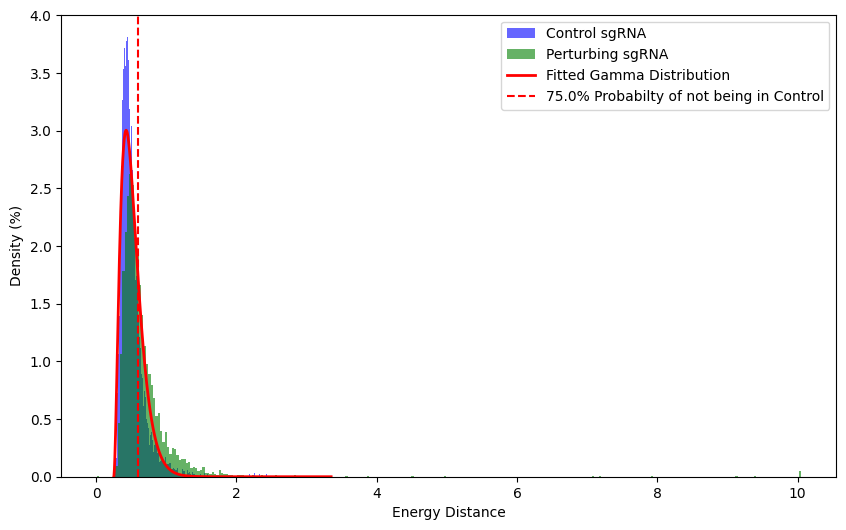

3211/7442 Perturbing sgRNA cross threshold of 0.75


In [ ]:
alpha_filtered, alpha_null_distances, alpha_results = qc2.filter_sgRNA(knockdown_adata_alpha)

extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:03)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:19)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])


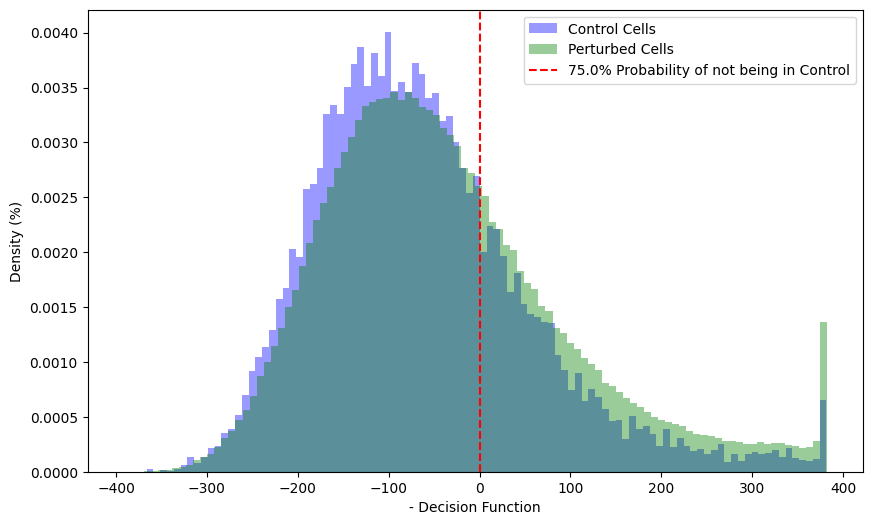

83534/258747 Perturbed Cells cross threshold of 0.75


In [ ]:
adata_alpha_filtered, c, p = qc2.remove_unperturbed_cells(adata_alpha, threshold=0.75)

In [ ]:
perturbation_counts = dict(adata_alpha_filtered.obs.gene_target.value_counts())
remaining_perturbations = [k for k,v in perturbation_counts.items() if v >= 25]
print(len(remaining_perturbations),remaining_perturbations)

1467 ['NTC', 'KAT2A', 'ZFP41', 'ARHGAP35', 'LRPPRC', 'DNMT1', 'CABIN1', 'ZNF354A', 'BHLHE40', 'EMSY', 'CHAMP1', 'EHMT1', 'PCGF1', 'PWWP2B', 'SMAD9', 'MEIS3', 'ELOC', 'HASPIN', 'PNPT1', 'HMCES', 'FOXH1', 'EZH2', 'TFAM', 'SIN3B', 'EHMT2', 'SHOX2', 'HMGB4', 'RNASEH1', 'ZBTB22', 'ALKBH1', 'METTL18', 'ZNF383', 'SMARCC1', 'ZNF521', 'SMARCE1', 'UHRF1', 'ZNF787', 'SLF1', 'DDX6', 'COMTD1', 'FOXS1', 'ACTB', 'ZNF75D', 'ETS1', 'ZNF219', 'PCGF6', 'ZFP1', 'POU5F1', 'NEK9', 'ZFP69B', 'SKP2', 'SOX4', 'NABP2', 'PDP1', 'POLRMT', 'ZNF462', 'LEMD3', 'EYA3', 'NEUROD4', 'SUZ12', 'MTA1', 'DOT1L', 'NANOG', 'ETV1', 'ESRRA', 'ZNF394', 'SLX1A', 'GATA2', 'TBX20', 'ZNF791', 'H2AC11', 'CARNMT1', 'THAP12', 'POGZ', 'ZNF419', 'TENT4B', 'ERVK3-1', 'NFIL3', 'KLF6', 'RLIM', 'FOXJ2', 'SETDB1', 'EPAS1', 'TIGD2', 'CRTC2', 'ZKSCAN1', 'H2BW2', 'KMT2D', 'FOXO3B', 'ZNF418', 'SMAD4', 'BARX1', 'PURG', 'RCOR2', 'ZNF180', 'SHOX', 'TWIST1', 'BCL6B', 'DIS3L', 'PPCS', 'MSX2', 'TRMT10C', 'E2F4', 'HES6', 'RORC', 'ZNF20', 'TP53BP1', 'BRP

In [ ]:
adata_alpha_filtered = qc2.remove_perturbations_by_cell_threshold(adata_alpha_filtered)

Removing 739 perturbations for having under 25 cells.


BETA

/home/ranwyl/data_tf_project/pan_genome_analysis_functions.py:519: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
computing PCA
    with n_comps=50
    finished (0:00:10)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:42)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:45)


Computing null distribution:   0%|          | 0/10000 [00:00<?, ?it/s]

Computing group distances:   0%|          | 0/8805 [00:00<?, ?it/s]

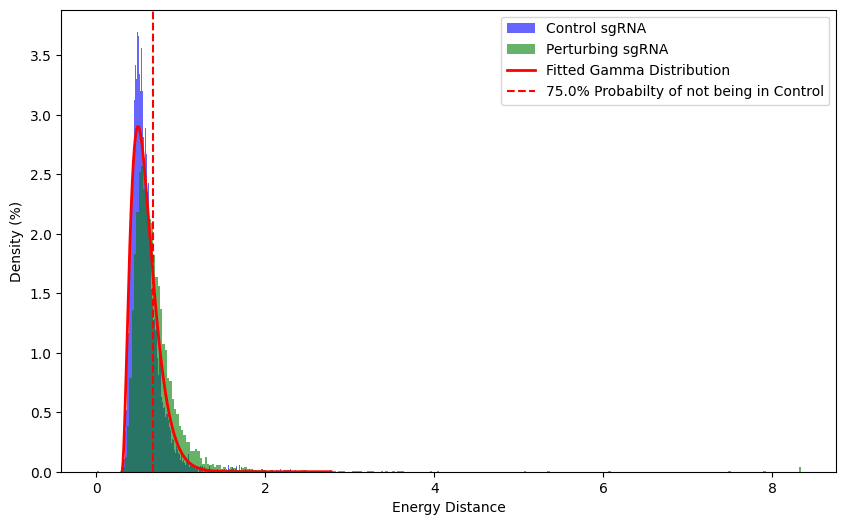

3714/8805 Perturbing sgRNA cross threshold of 0.75


In [ ]:
beta_filtered, beta_null_distances, beta_results = qc2.filter_sgRNA(knockdown_adata_beta)

extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:04)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:21)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])


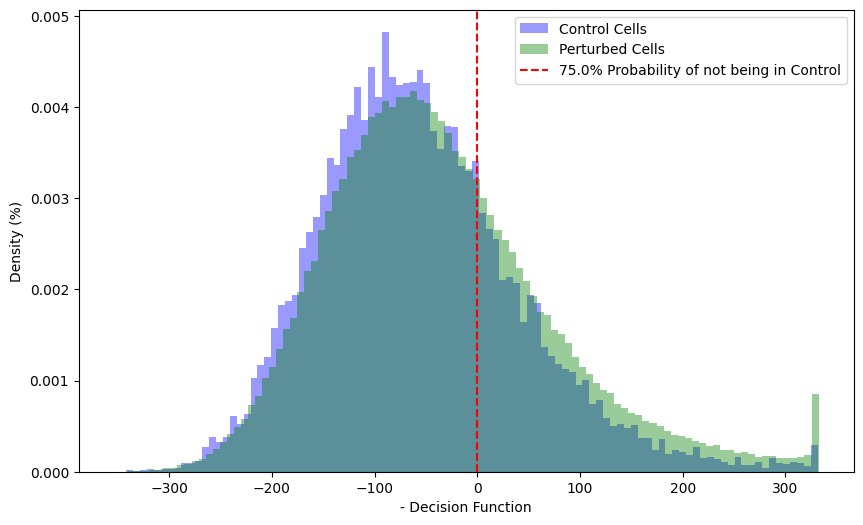

95740/306162 Perturbed Cells cross threshold of 0.75


In [ ]:
adata_beta_filtered, c, p = qc2.remove_unperturbed_cells(adata_beta, threshold=0.75)

In [ ]:
perturbation_counts = dict(adata_beta_filtered.obs.gene_target.value_counts())
remaining_perturbations = [k for k,v in perturbation_counts.items() if v >= 25]
print(len(remaining_perturbations),remaining_perturbations)

1696 ['NTC', 'SCAF4', 'CASP6', 'LATS2', 'BBC3', 'HCCS', 'IKBIP', 'UBFD1', 'FBXO45', 'VHL', 'JOSD1', 'VPS33A', 'UBE2M', 'RHOG', 'TESK1', 'SLC30A1', 'ETNK2', 'NAE1', 'CTAGE15', 'SGSM3', 'ACOT8', 'DSTN', 'CYCS', 'PPP1R14B', 'NCKAP5L', 'ARFRP1', 'FZD9', 'CASP3', 'IPO9', 'OSBPL2', 'BAX', 'SENP5', 'ATPAF1', 'MRPL36', 'LAMTOR1', 'YPEL3', 'TXNDC12', 'CHGA', 'LAMTOR5', 'POGLUT3', 'CLDN3', 'ACTN1', 'PACSIN1', 'CDKN2AIPNL', 'TPST2', 'MTRF1L', 'CCDC6', 'MZT2A', 'SH3BGRL3', 'ARFGAP1', 'ART5', 'C1orf159', 'CLPTM1L', 'IRAK1', 'FBXO44', 'SPRY2', 'CAPRIN2', 'CDK5R1', 'PPP1R1A', 'GRPEL2', 'IFNGR1', 'ZFPL1', 'PODXL2', 'SLC39A1', 'CAPN1', 'TWSG1', 'SLC35F6', 'FAM120AOS', 'LYSMD3', 'POLDIP2', 'DUS4L', 'TMSB4Y', 'ATAD1', 'MOSPD1', 'TCAF1', 'CLUH', 'VPS39', 'TEFM', 'FADS1', 'SLC30A5', 'KHDC4', 'MTCH1', 'SLC39A13', 'TOE1', 'VKORC1', 'GPR137', 'IFFO1', 'FJX1', 'SLC29A1', 'CAVIN1', 'LZTS2', 'FAM210B', 'WBP1', 'PTPN1', 'MRPL24', 'LIMD2', 'DPH2', 'TM6SF2', 'SNCG', 'LRCH4', 'FNDC10', 'CCDC78', 'STEAP3', 'BCKDK', '

In [ ]:
adata_beta_filtered = qc2.remove_perturbations_by_cell_threshold(adata_beta_filtered)

Removing 800 perturbations for having under 25 cells.


GAMMA

/home/ranwyl/data_tf_project/pan_genome_analysis_functions.py:519: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
computing PCA
    with n_comps=50
    finished (0:00:09)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:38)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:41)


Computing null distribution:   0%|          | 0/10000 [00:00<?, ?it/s]

Computing group distances:   0%|          | 0/8396 [00:00<?, ?it/s]

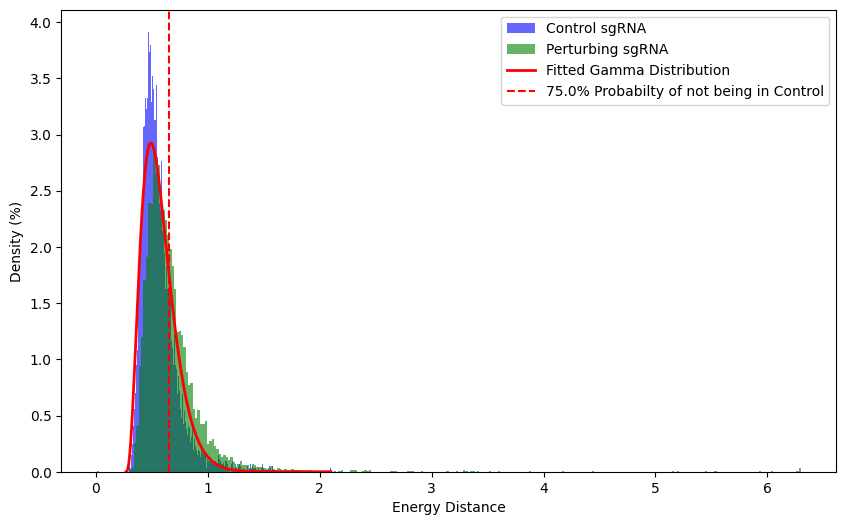

3383/8396 Perturbing sgRNA cross threshold of 0.75


In [ ]:
gamma_filtered, gamma_null_distances, gamma_results = qc2.filter_sgRNA(knockdown_adata_gamma)

extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:02)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:15)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])


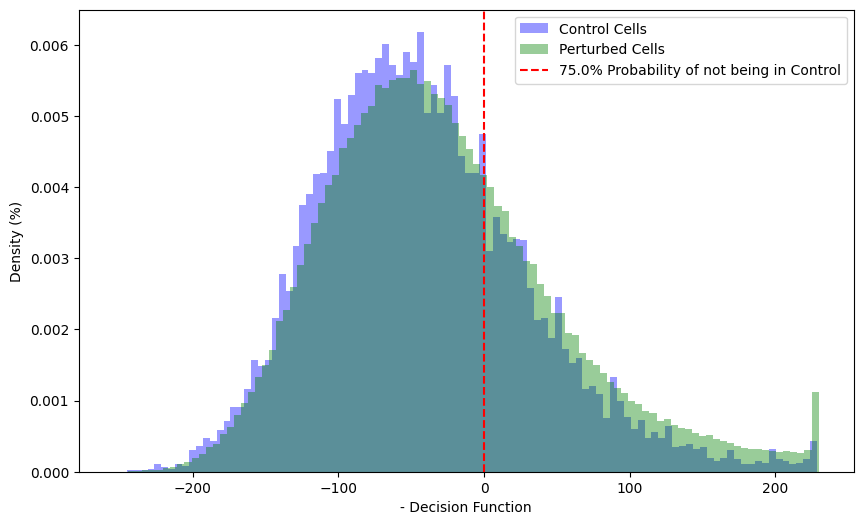

62877/205929 Perturbed Cells cross threshold of 0.75


In [ ]:
adata_gamma_filtered, c, p = qc2.remove_unperturbed_cells(adata_gamma, threshold=0.75)

In [ ]:
perturbation_counts = dict(adata_gamma_filtered.obs.gene_target.value_counts())
remaining_perturbations = [k for k,v in perturbation_counts.items() if v >= 25]
print(len(remaining_perturbations),remaining_perturbations)

1070 ['NTC', 'SUPT20H', 'FLYWCH2', 'FAM193A', 'DDT', 'RNF144A', 'NF2', 'FLCN', 'ENTPD8', 'HS2ST1', 'SCARB1', 'CNST', 'HCN2', 'RALGAPB', 'TIMM50', 'MMP16', 'CTAGE15', 'IL17RD', 'EIF4ENIF1', 'RASA2', 'WDR37', 'DRD4', 'FBXO31', 'CEP43', 'TGFBR2', 'RBM5', 'C1orf21', 'TEX2', 'STK10', 'TMEM74B', 'DENND1C', 'FAM241B', 'CRIM1', 'RAB8B', 'KLHL24', 'C3orf52', 'KCNF1', 'CEP78', 'PUS1', 'HIPK2', 'STOML1', 'RGPD5', 'PARD6G', 'PIP4P2', 'KIF17', 'NUAK2', 'MCOLN1', 'MMRN2', 'NRBP1', 'CFP', 'CACUL1', 'PDZD8', 'TBC1D7', 'AGTPBP1', 'YPEL1', 'ANXA2', 'CTAGE4', 'PAQR3', 'CLPSL2', 'ABCG1', 'PON2', 'DNAJB5', 'FAM200B', 'PEX13', 'HMCN2', 'MTPAP', 'GOLGA4', 'BTBD10', 'DTX1', 'ANXA6', 'MRRF', 'MLYCD', 'SYAP1', 'DAP', 'TBK1', 'TMEM179B', 'TRABD', 'DNAJC28', 'GRSF1', 'SLC17A7', 'FAM117B', 'SPATA25', 'UNC5B', 'LAMC3', 'CAPNS1', 'BEST4', 'BLTP3B', 'MAP4K2', 'SULF2', 'RET', 'BPGM', 'CYP2D6', 'CCDC28B', 'PCMTD1', 'GOLT1A', 'DENND4B', 'SPAG9', 'MADD', 'ANKRD17', 'CCER2', 'RNF7', 'EFNB3', 'BCL2L12', 'MAEA', 'ITPRID2', 

In [ ]:
adata_gamma_filtered = qc2.remove_perturbations_by_cell_threshold(adata_gamma_filtered)

Removing 1331 perturbations for having under 25 cells.


**Dataset: 3 MADs**

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:16)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:19)
    computed connectivities (0:00:12)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:32)


Computing null distribution:   0%|          | 0/20 [00:00<?, ?it/s]

Computing group distances:   0%|          | 0/8694 [00:00<?, ?it/s]

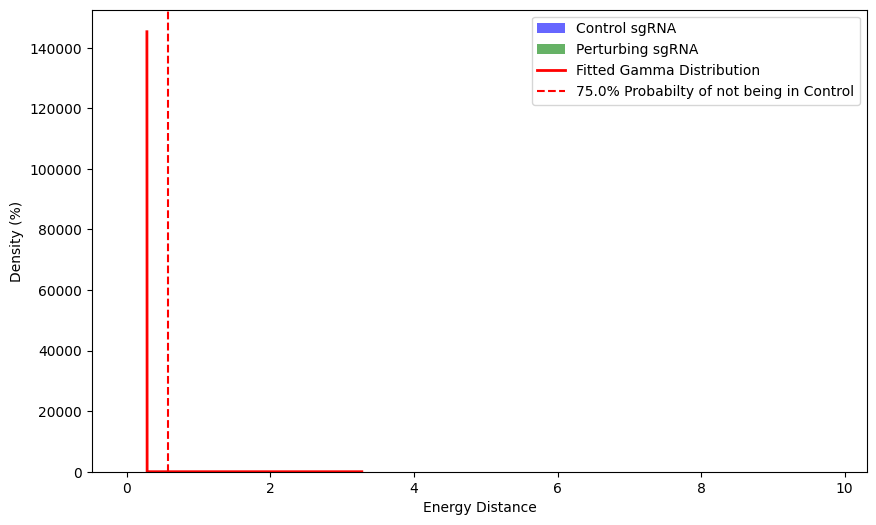

4492/8694 Perturbing sgRNA cross threshold of 0.75


In [ ]:
beta_filtered, beta_null_distances, beta_results = qc2.filter_sgRNA_random_seed(knockdown_adata_beta)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:08)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:07)
    computed connectivities (0:00:11)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:18)


Computing null distribution:   0%|          | 0/10000 [00:00<?, ?it/s]

Computing group distances:   0%|          | 0/8694 [00:00<?, ?it/s]

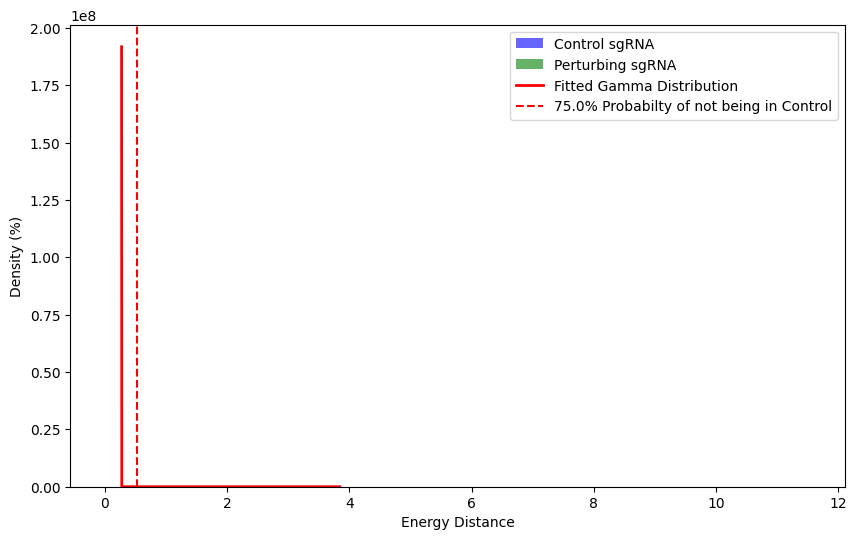

5917/8694 Perturbing sgRNA cross threshold of 0.75


In [ ]:
beta_filtered2, beta_null_distances2, beta_results2 = qc2.filter_sgRNA(knockdown_adata_beta)

In [ ]:
def plot_energy_distance_distribution(null_distances, results, threshold=0.75):
    # Fit a gamma distribution to the control data
    alpha_mle, loc_mle, beta_mle = gamma.fit(null_distances, loc=0.3)

    #Get perturbed cell distribution
    perturbed_gRNA_edist = np.array(list(results.values()))
    perturbed_gRNA = np.array(list(results.keys()))

    # Plot the histogram of the data and the fitted gamma distribution
    x = np.linspace(np.min(null_distances), np.max(null_distances), 1000)
    pdf_fitted = gamma.pdf(x, alpha_mle, loc=loc_mle, scale=beta_mle)

    # Compute threshold value from gamma distribution
    thresh_val = gamma.ppf(threshold, alpha_mle, loc=loc_mle, scale=beta_mle)

    # Plot control and perturbing sgRNA
    plt.figure(figsize=(10, 6))
    plt.hist(null_distances, bins=300, density=True, alpha=0.6, color='b', label="Control sgRNA")
    plt.hist(np.clip(perturbed_gRNA_edist,0,max(null_distances)*3), bins=300, density=True, alpha=0.6, color='g', label="Perturbing sgRNA")
    
    # Scale gamma distribution to histogram height
    # hist_vals, bin_edges = np.histogram(null_distances, bins=300, density=True)
    # scale_factor = hist_vals.max() / pdf_fitted.max()
    # plt.plot(x, pdf_fitted * scale_factor, 'r-', lw=2, label="Fitted Gamma Distribution")

    # Plot histogram with percentage scaling
    # plt.hist(null_distances, bins=50, weights=np.ones_like(null_distances)/len(null_distances)*100,
    #          alpha=0.6, color='b', label="Control sgRNA")
    # plt.hist(np.clip(perturbed_gRNA_edist, 0, max(perturbed_gRNA_edist)), bins=50,
    #          weights=np.ones_like(perturbed_gRNA_edist)/len(perturbed_gRNA_edist)*100,
    #          alpha=0.6, color='g', label="Perturbing sgRNA")

    plt.plot(x, pdf_fitted, 'r-', lw=2, label="Fitted Gamma Distribution")
    plt.axvline(x=thresh_val, color='r', linestyle='--', label=f"{threshold*100}% Probabilty of not being in Control")
    plt.xlabel("Energy Distance")
    plt.ylabel("Density (%)")
    plt.legend()
    plt.show()
    print(f"{sum(perturbed_gRNA_edist > thresh_val)}/{len(perturbed_gRNA_edist)} Perturbing sgRNA cross threshold of {threshold}")

# (OLD CODE) Steps G, H, I following pipeline exactly

### STEP G: Differential Expression Analysis

Now we will perform differential expression analysis (DEA) on a pseudobulk representation of the data using a boostrapping method to create pseudoreplicates. Then we will define "strong" perturbations as perturbations with >= 10 differentially expressed genes (DEGs).

Write modified Step G functions based on the study pipeline

In [ ]:
def tf_run_deseq2_analysis(adata, n_jobs, gene_target_obs_column="gene_target", ntc_cells_delimiter="NTC", 
                                      n_replicates=3, sample_fraction=0.7, layer=None, alpha=0.05):
    ntc_cells = np.where(adata.obs[gene_target_obs_column] == ntc_cells_delimiter)[0]
    gene_targets = list(adata.obs[gene_target_obs_column].unique())
    gene_targets.remove(ntc_cells_delimiter)  # Remove the control group

    def process_gene_target(gene_target):
        pseudo_bulk_df, metadata_df = qc2.generate_pseudo_bulk_replicates_for_de(
            adata, gene_target, ntc_cells, n_replicates=n_replicates, sample_fraction=sample_fraction, layer=layer
        )
        return qc2.deseq2(pseudo_bulk_df, metadata_df, contrast=["condition", gene_target, ntc_cells_delimiter], alpha=alpha)

    with tqdm_joblib(desc="Running DE analysis", total=len(gene_targets)):
        results = Parallel(n_jobs=n_jobs)(delayed(process_gene_target)(gene_target) for gene_target in gene_targets)
    
    results_dict = dict(zip(gene_targets, results))
    
    return results_dict

def tf_save_DEG_df(results_dict, p_threshold=0.05, save=True, filepath=None):
    # Initialize a dictionary to store columns for the final DataFrame
    final_dict = {}

    for gene_target, df in results_dict.items():
        # Filter the DataFrame based on the padj (adjusted p-value) threshold
        filtered_df = df[df['padj'] < p_threshold]

        # Sort by L2FC
        l2fc_sorted = filtered_df.sort_values('log2FoldChange')
        
        # Create columns for DEGs, L2FC, and Adj_P and add them to the final_dict
        final_dict[f'{gene_target}_DEGs'] = l2fc_sorted.index.tolist()
        final_dict[f'{gene_target}_L2FC'] = l2fc_sorted['log2FoldChange'].tolist()
        final_dict[f'{gene_target}_Adj_P'] = l2fc_sorted['padj'].tolist()

    # Group keys by gene target to maintain adjacency
    gene_targets = list(results_dict.keys())
    
    # Sort the gene targets by the number of DEGs
    sorted_gene_targets = sorted(gene_targets, key=lambda gt: len(final_dict[f'{gt}_DEGs']), reverse=True)
    
    # Reorder the final_dict to keep DEGs, L2FC, and Adj_P together for each gene target
    ordered_dict = {}
    for gene_target in sorted_gene_targets:
        ordered_dict[f'{gene_target}_DEGs'] = final_dict[f'{gene_target}_DEGs']
        ordered_dict[f'{gene_target}_L2FC'] = final_dict[f'{gene_target}_L2FC']
        ordered_dict[f'{gene_target}_Adj_P'] = final_dict[f'{gene_target}_Adj_P']

    # Find the maximum length of lists in the ordered_dict to handle unequal lengths
    max_length = max(len(lst) for lst in ordered_dict.values())

    # Pad shorter lists with None to ensure equal length columns
    for key in ordered_dict:
        ordered_dict[key].extend([None] * (max_length - len(ordered_dict[key])))

    # Create the final DataFrame directly from the dictionary
    combined_df = pd.DataFrame(ordered_dict)

    if save and filepath:
        with pd.ExcelWriter(filepath) as writer:
            combined_df.to_excel(writer, sheet_name='DEG Results', index=False)

Max RAM used for ALPHA = 573GB at 65% done. Total time ~20min to run `tf_run_deseq_2_analysis()` on 1466 genes and 1.5min to save `.xlsx` file

In [ ]:
adata_alpha = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_ALPHA_Core_Cells.h5ad")
adata_alpha.X = adata_alpha.layers["counts"].copy()
results_dict_alpha = tf_run_deseq2_analysis(adata_alpha, 25)

In [ ]:
alpha_filepath = "/home/ranwyl/results_tf_project/ALPHA_DEGs.xlsx"
tf_save_DEG_df(results_dict_alpha, filepath=alpha_filepath)

Max RAM used for BETA = 610G at 54% done.

In [ ]:
adata_beta = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_BETA_Core_Cells.h5ad")
adata_beta.X = adata_beta.layers["counts"].copy()
results_dict_beta = tf_run_deseq2_analysis(adata_beta, 27)

In [ ]:
beta_filepath = "/home/ranwyl/results_tf_project/BETA_DEGs.xlsx"
tf_save_DEG_df(results_dict_beta, filepath=beta_filepath)

In [ ]:
adata_gamma = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_GAMMA_Core_Cells.h5ad")
adata_gamma.X = adata_gamma.layers["counts"].copy()
results_dict_gamma = tf_run_deseq2_analysis(adata_gamma, 30)

In [ ]:
gamma_filepath = "/home/ranwyl/results_tf_project/GAMMA_DEGs.xlsx"
tf_save_DEG_df(results_dict_gamma, filepath=gamma_filepath)

Filter strong perturbations

In [ ]:
alpha_degs = pd.read_excel("/home/ranwyl/results_tf_project/ALPHA_DEGs.xlsx")
beta_degs = pd.read_excel("/home/ranwyl/results_tf_project/BETA_DEGs.xlsx")
gamma_degs = pd.read_excel("/home/ranwyl/results_tf_project/GAMMA_DEGs.xlsx")

In [ ]:
alpha_degs.loc[:, alpha_degs.columns.str.contains("CTAGE15")]

In [ ]:
strong_perturbations, DEGs = qc2.create_deg_list(alpha_degs, beta_degs, gamma_degs, deg_cutoff=10)

1361 Perturbations Left at a cutoff of 10 DEGs


In [ ]:
with open("/home/ranwyl/results_tf_project/strong_perturbations.txt",'w') as file:
    for item in strong_perturbations:
        file.write(f"{item}\n")

In [ ]:
DEGs.to_excel("/home/ranwyl/results_tf_project/Aggregate_DEGs.xlsx")

In [ ]:
strong_perturbations = list()
with open("/home/ranwyl/results_tf_project/strong_perturbations.txt") as f:
    strong_perturbations = f.read().split()
print(strong_perturbations[:5])

['POU5F1', 'MYADM', 'DBR1', 'PHF20', 'PSMD8']


In [ ]:
adata_alpha = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_ALPHA_Core_Cells.h5ad")
adata_beta = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_BETA_Core_Cells.h5ad")
adata_gamma = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_GAMMA_Core_Cells.h5ad")

In [ ]:
adata_alpha_filtered = adata_alpha[adata_alpha.obs.gene_target.isin(strong_perturbations)].copy()
adata_beta_filtered = adata_beta[adata_beta.obs.gene_target.isin(strong_perturbations)].copy()
adata_gamma_filtered = adata_gamma[adata_gamma.obs.gene_target.isin(strong_perturbations)].copy()

In [ ]:
del adata_alpha, adata_beta, adata_gamma
gc.collect()

3776

In [ ]:
adata_combined = ad.concat([adata_alpha_filtered,adata_beta_filtered,adata_gamma_filtered])
adata_combined.X = adata_combined.layers["counts"].copy()

In [ ]:
median_NTC_UMIs = np.median(qc2._get_ntc_view(adata_combined).obs.n_UMI_counts)
sc.pp.normalize_total(adata_combined, target_sum=median_NTC_UMIs)

normalizing counts per cell
    finished (0:00:00)


### Step H: Batch Correction

In [ ]:
sc.pp.log1p(adata_combined)
a = adata_combined[adata_combined.obs.run == 'ALPHA'].copy()
b = adata_combined[adata_combined.obs.run == 'BETA'].copy()
c = adata_combined[adata_combined.obs.run == 'GAMMA'].copy()

In [ ]:
del adata_combined
gc.collect()

1177

In [ ]:
qc2.relative_z_normalization(a)

In [ ]:
qc2.relative_z_normalization(b)
qc2.relative_z_normalization(c)
normalized_adata = ad.concat([a,b,c])

In [ ]:
normalized_adata.write("/home/ranwyl/data_tf_project/Aggregate_Strong_Perturbations_Batch_Normalized.h5ad")

In [ ]:
normalized_adata

AnnData object with n_obs × n_vars = 111902 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

### Remove duplicates from DEG spreadsheet and save final version

Read in and view the DataFrame of DEGs for each strong perturbation (output from the study pipeline), `deg_df`

In [ ]:
deg_df = pd.read_excel("/home/ranwyl/results_tf_project/Aggregate_DEGs.xlsx", index_col=0)
deg_df

,POU5F1_DEGs,POU5F1_L2FC,POU5F1_Adj_P,MYADM_DEGs,MYADM_L2FC,MYADM_Adj_P,DBR1_DEGs,DBR1_L2FC,DBR1_Adj_P,PHF20_DEGs,...,CTAGE15_L2FC.12,CTAGE15_L2FC.13,CTAGE15_Adj_P.12,CTAGE15_Adj_P.13,CTAGE15_DEGs.14,CTAGE15_DEGs.15,CTAGE15_L2FC.14,CTAGE15_L2FC.15,CTAGE15_Adj_P.14,CTAGE15_Adj_P.15
0,DGKB,-6.076206,0.020763,TMEM220-AS1,-5.864895,0.026192,LMO3,-4.732414,0.017708,SLC22A23,...,-0.736635,NaN,0.025886,NaN,KRAS,NaN,-0.736635,NaN,0.025886,NaN
1,AP3B2,-5.457997,0.046913,ST6GAL2,-5.740117,0.031954,TMEM220-AS1,-4.144787,0.004143,ATG101,...,-0.649359,NaN,0.042101,NaN,PAFAH1B1,NaN,-0.649359,NaN,0.042101,NaN
2,TRNP1,-5.160944,0.004823,ENSG00000233290,-5.040239,0.018569,ZMYM3,-3.650721,0.002669,ORAI1,...,-0.621081,NaN,0.036694,NaN,ABI2,NaN,-0.621081,NaN,0.036694,NaN
3,ENSG00000259048,-5.015852,0.000079,TRIM56,-5.013357,0.006675,ENSG00000289084,-3.543780,0.000107,SUCLG1,...,-0.463132,NaN,0.046703,NaN,PABPN1,NaN,-0.463132,NaN,0.046703,NaN
4,SYNPO2,-4.207629,0.040667,TMEM158,-4.394789,0.025331,SRRM4,-3.528674,0.028472,ZNF581,...,-0.333667,NaN,0.025886,NaN,RPL38,NaN,-0.333667,NaN,0.025886,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1833,ENSG00000254202,8.638068,0.000195,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1834,DLX5,8.798191,0.000137,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1835,MEIS2,9.215727,0.000053,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1836,DLK1,9.618622,0.000020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


When we scroll to the end, it looks like CTAGE15 appears multiple times. Now we know we need to remove duplicate entries that contain the "." character. We will check for these entries:

In [ ]:
deg_df.loc[:, deg_df.columns.str.contains(".", regex=False)]

,CTAGE15_DEGs.1,CTAGE15_L2FC.1,CTAGE15_Adj_P.1,CTAGE15_DEGs.2,CTAGE15_DEGs.3,CTAGE15_L2FC.2,CTAGE15_L2FC.3,CTAGE15_Adj_P.2,CTAGE15_Adj_P.3,CTAGE15_DEGs.4,...,CTAGE15_L2FC.12,CTAGE15_L2FC.13,CTAGE15_Adj_P.12,CTAGE15_Adj_P.13,CTAGE15_DEGs.14,CTAGE15_DEGs.15,CTAGE15_L2FC.14,CTAGE15_L2FC.15,CTAGE15_Adj_P.14,CTAGE15_Adj_P.15
0,NaN,NaN,NaN,KRAS,NaN,-0.736635,NaN,0.025886,NaN,KRAS,...,-0.736635,NaN,0.025886,NaN,KRAS,NaN,-0.736635,NaN,0.025886,NaN
1,NaN,NaN,NaN,PAFAH1B1,NaN,-0.649359,NaN,0.042101,NaN,PAFAH1B1,...,-0.649359,NaN,0.042101,NaN,PAFAH1B1,NaN,-0.649359,NaN,0.042101,NaN
2,NaN,NaN,NaN,ABI2,NaN,-0.621081,NaN,0.036694,NaN,ABI2,...,-0.621081,NaN,0.036694,NaN,ABI2,NaN,-0.621081,NaN,0.036694,NaN
3,NaN,NaN,NaN,PABPN1,NaN,-0.463132,NaN,0.046703,NaN,PABPN1,...,-0.463132,NaN,0.046703,NaN,PABPN1,NaN,-0.463132,NaN,0.046703,NaN
4,NaN,NaN,NaN,RPL38,NaN,-0.333667,NaN,0.025886,NaN,RPL38,...,-0.333667,NaN,0.025886,NaN,RPL38,NaN,-0.333667,NaN,0.025886,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1833,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1834,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1835,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


It looks like CTAGE15 is the only duplicate entry. We will look at all columns that contain "CTAGE15":

In [ ]:
deg_df.loc[:, deg_df.columns.str.contains("CTAGE15")]

,CTAGE15_DEGs,CTAGE15_DEGs.1,CTAGE15_L2FC,CTAGE15_L2FC.1,CTAGE15_Adj_P,CTAGE15_Adj_P.1,CTAGE15_DEGs.2,CTAGE15_DEGs.3,CTAGE15_L2FC.2,CTAGE15_L2FC.3,...,CTAGE15_L2FC.12,CTAGE15_L2FC.13,CTAGE15_Adj_P.12,CTAGE15_Adj_P.13,CTAGE15_DEGs.14,CTAGE15_DEGs.15,CTAGE15_L2FC.14,CTAGE15_L2FC.15,CTAGE15_Adj_P.14,CTAGE15_Adj_P.15
0,KRAS,NaN,-0.736635,NaN,0.025886,NaN,KRAS,NaN,-0.736635,NaN,...,-0.736635,NaN,0.025886,NaN,KRAS,NaN,-0.736635,NaN,0.025886,NaN
1,PAFAH1B1,NaN,-0.649359,NaN,0.042101,NaN,PAFAH1B1,NaN,-0.649359,NaN,...,-0.649359,NaN,0.042101,NaN,PAFAH1B1,NaN,-0.649359,NaN,0.042101,NaN
2,ABI2,NaN,-0.621081,NaN,0.036694,NaN,ABI2,NaN,-0.621081,NaN,...,-0.621081,NaN,0.036694,NaN,ABI2,NaN,-0.621081,NaN,0.036694,NaN
3,PABPN1,NaN,-0.463132,NaN,0.046703,NaN,PABPN1,NaN,-0.463132,NaN,...,-0.463132,NaN,0.046703,NaN,PABPN1,NaN,-0.463132,NaN,0.046703,NaN
4,RPL38,NaN,-0.333667,NaN,0.025886,NaN,RPL38,NaN,-0.333667,NaN,...,-0.333667,NaN,0.025886,NaN,RPL38,NaN,-0.333667,NaN,0.025886,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1833,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1834,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1835,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We see that there are columns labeled "CTAGE15_DEGs", "CTAGE15_L2FC" and "CTAGE15_Adj_P" along with the additional columns. Some of these columns look like they may only contain NaN, so we will remove columns that only contain NaN from the DataFrame, and view the columns containing "CTAGE15" again.

In [ ]:
deg_df = deg_df.dropna(axis=1, how="all")
deg_df.loc[:, deg_df.columns.str.contains("CTAGE15")]

,CTAGE15_DEGs,CTAGE15_L2FC,CTAGE15_Adj_P,CTAGE15_DEGs.2,CTAGE15_L2FC.2,CTAGE15_Adj_P.2,CTAGE15_DEGs.4,CTAGE15_L2FC.4,CTAGE15_Adj_P.4,CTAGE15_DEGs.6,...,CTAGE15_Adj_P.8,CTAGE15_DEGs.10,CTAGE15_L2FC.10,CTAGE15_Adj_P.10,CTAGE15_DEGs.12,CTAGE15_L2FC.12,CTAGE15_Adj_P.12,CTAGE15_DEGs.14,CTAGE15_L2FC.14,CTAGE15_Adj_P.14
0,KRAS,-0.736635,0.025886,KRAS,-0.736635,0.025886,KRAS,-0.736635,0.025886,KRAS,...,0.025886,KRAS,-0.736635,0.025886,KRAS,-0.736635,0.025886,KRAS,-0.736635,0.025886
1,PAFAH1B1,-0.649359,0.042101,PAFAH1B1,-0.649359,0.042101,PAFAH1B1,-0.649359,0.042101,PAFAH1B1,...,0.042101,PAFAH1B1,-0.649359,0.042101,PAFAH1B1,-0.649359,0.042101,PAFAH1B1,-0.649359,0.042101
2,ABI2,-0.621081,0.036694,ABI2,-0.621081,0.036694,ABI2,-0.621081,0.036694,ABI2,...,0.036694,ABI2,-0.621081,0.036694,ABI2,-0.621081,0.036694,ABI2,-0.621081,0.036694
3,PABPN1,-0.463132,0.046703,PABPN1,-0.463132,0.046703,PABPN1,-0.463132,0.046703,PABPN1,...,0.046703,PABPN1,-0.463132,0.046703,PABPN1,-0.463132,0.046703,PABPN1,-0.463132,0.046703
4,RPL38,-0.333667,0.025886,RPL38,-0.333667,0.025886,RPL38,-0.333667,0.025886,RPL38,...,0.025886,RPL38,-0.333667,0.025886,RPL38,-0.333667,0.025886,RPL38,-0.333667,0.025886
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1833,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1834,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1835,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Get list of column names containing "CTAGE15"

In [ ]:
pert_cols = deg_df.loc[:, deg_df.columns.str.contains("CTAGE15")].columns.tolist()
print(pert_cols)

['CTAGE15_DEGs', 'CTAGE15_L2FC', 'CTAGE15_Adj_P', 'CTAGE15_DEGs.2', 'CTAGE15_L2FC.2', 'CTAGE15_Adj_P.2', 'CTAGE15_DEGs.4', 'CTAGE15_L2FC.4', 'CTAGE15_Adj_P.4', 'CTAGE15_DEGs.6', 'CTAGE15_L2FC.6', 'CTAGE15_Adj_P.6', 'CTAGE15_DEGs.8', 'CTAGE15_L2FC.8', 'CTAGE15_Adj_P.8', 'CTAGE15_DEGs.10', 'CTAGE15_L2FC.10', 'CTAGE15_Adj_P.10', 'CTAGE15_DEGs.12', 'CTAGE15_L2FC.12', 'CTAGE15_Adj_P.12', 'CTAGE15_DEGs.14', 'CTAGE15_L2FC.14', 'CTAGE15_Adj_P.14']


Check that all "CTAGE15_DEGs" columns are equal, all _L2FC columns are equal, and all _Adj_P columns are equal.

In [ ]:
# Lists of CTAGE15 column names
pert_deg_cols = [col for col in pert_cols if "DEGs" in col]
pert_l2fc_cols = [col for col in pert_cols if "L2FC" in col]
pert_adj_p_cols = [col for col in pert_cols if "Adj_P" in col]

def cols_equal(df, all_cols: tuple[list]):
    cols_equal = True
    for col_list in all_cols:
        for col in col_list[1:]:
            if df[col_list[0]].equals(df[col]) == False:
                cols_equal = False
    print("All columns of same category are equal") if cols_equal else print("Not all columns of same category are equal")

cols_equal(deg_df, (pert_deg_cols, pert_l2fc_cols, pert_adj_p_cols))

All columns of same category are equal


Drop the CTAGE15 columns containing "."

In [ ]:
cols_to_drop = pert_cols[3:]
print(cols_to_drop)

['CTAGE15_DEGs.2', 'CTAGE15_L2FC.2', 'CTAGE15_Adj_P.2', 'CTAGE15_DEGs.4', 'CTAGE15_L2FC.4', 'CTAGE15_Adj_P.4', 'CTAGE15_DEGs.6', 'CTAGE15_L2FC.6', 'CTAGE15_Adj_P.6', 'CTAGE15_DEGs.8', 'CTAGE15_L2FC.8', 'CTAGE15_Adj_P.8', 'CTAGE15_DEGs.10', 'CTAGE15_L2FC.10', 'CTAGE15_Adj_P.10', 'CTAGE15_DEGs.12', 'CTAGE15_L2FC.12', 'CTAGE15_Adj_P.12', 'CTAGE15_DEGs.14', 'CTAGE15_L2FC.14', 'CTAGE15_Adj_P.14']


In [ ]:
deg_df = deg_df.drop(cols_to_drop, axis=1)
deg_df

,POU5F1_DEGs,POU5F1_L2FC,POU5F1_Adj_P,MYADM_DEGs,MYADM_L2FC,MYADM_Adj_P,DBR1_DEGs,DBR1_L2FC,DBR1_Adj_P,PHF20_DEGs,...,ZFP90_Adj_P,TFB2M_DEGs,TFB2M_L2FC,TFB2M_Adj_P,GTF2H5_DEGs,GTF2H5_L2FC,GTF2H5_Adj_P,PRDM12_DEGs,PRDM12_L2FC,PRDM12_Adj_P
0,DGKB,-6.076206,0.020763,TMEM220-AS1,-5.864895,0.026192,LMO3,-4.732414,0.017708,SLC22A23,...,0.017758,MT-CO2,-0.647470,1.354147e-18,YWHAZ,-0.621721,0.022792,VPS35,-2.742694,0.019544
1,AP3B2,-5.457997,0.046913,ST6GAL2,-5.740117,0.031954,TMEM220-AS1,-4.144787,0.004143,ATG101,...,0.025551,MT-ND3,-0.527954,9.782593e-06,SRSF3,-0.554518,0.032492,COX7A2,-0.953482,0.028350
2,TRNP1,-5.160944,0.004823,ENSG00000233290,-5.040239,0.018569,ZMYM3,-3.650721,0.002669,ORAI1,...,0.019436,MT-CYB,-0.476602,9.782593e-06,NAP1L1,-0.385088,0.049216,LIN28A,-0.661256,0.028941
3,ENSG00000259048,-5.015852,0.000079,TRIM56,-5.013357,0.006675,ENSG00000289084,-3.543780,0.000107,SUCLG1,...,0.015435,MT-CO3,-0.444095,4.160858e-12,RPL30,-0.349790,0.020345,RPL39,-0.377708,0.010679
4,SYNPO2,-4.207629,0.040667,TMEM158,-4.394789,0.025331,SRRM4,-3.528674,0.028472,ZNF581,...,0.034280,MT-ATP6,-0.429478,9.971995e-08,RPL13A,-0.277933,0.030364,GRID2,0.378888,0.000166
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1833,ENSG00000254202,8.638068,0.000195,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1834,DLX5,8.798191,0.000137,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1835,MEIS2,9.215727,0.000053,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1836,DLK1,9.618622,0.000020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
deg_df.loc[:, deg_df.columns.str.contains("CTAGE15")]

,CTAGE15_DEGs,CTAGE15_L2FC,CTAGE15_Adj_P
0,KRAS,-0.736635,0.025886
1,PAFAH1B1,-0.649359,0.042101
2,ABI2,-0.621081,0.036694
3,PABPN1,-0.463132,0.046703
4,RPL38,-0.333667,0.025886
...,...,...,...
1833,NaN,NaN,NaN
1834,NaN,NaN,NaN
1835,NaN,NaN,NaN
1836,NaN,NaN,NaN


Sanity check: We started with 4104 columns and had 16*3 = 48 "CTAGE15" columns. We kept 3 columns and removed 45 columns for 4104 - 45 = 4059 columns remaining. Now we will save this file.

In [ ]:
deg_df.to_excel("/home/ranwyl/results_tf_project/Aggregate_DEGs_final.xlsx")

### Step I: Pairwise Pearson correlation matrix and MDE on Mali lab strong perturbation dataset following pipeline exactly

In [2]:
normalized_adata = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_Strong_Perturbations_Batch_Normalized.h5ad")
normalized_adata

AnnData object with n_obs × n_vars = 111902 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

Subset genes to 2000 HVGs

In [3]:
sc.pp.highly_variable_genes(normalized_adata, n_top_genes=2000, subset=False, flavor='seurat_v3', layer='counts', batch_key='run')
adata_mde_z_normalized = normalized_adata[:, normalized_adata.var['highly_variable']].copy()
adata_mde_z_normalized

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 111902 × 2000
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

Compute pairwise Pearson correlation matrix with Mali lab code

Computing mean profiles:   0%|          | 0/1354 [00:00<?, ?it/s]

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/anndata/_core/anndata.py:1096: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.


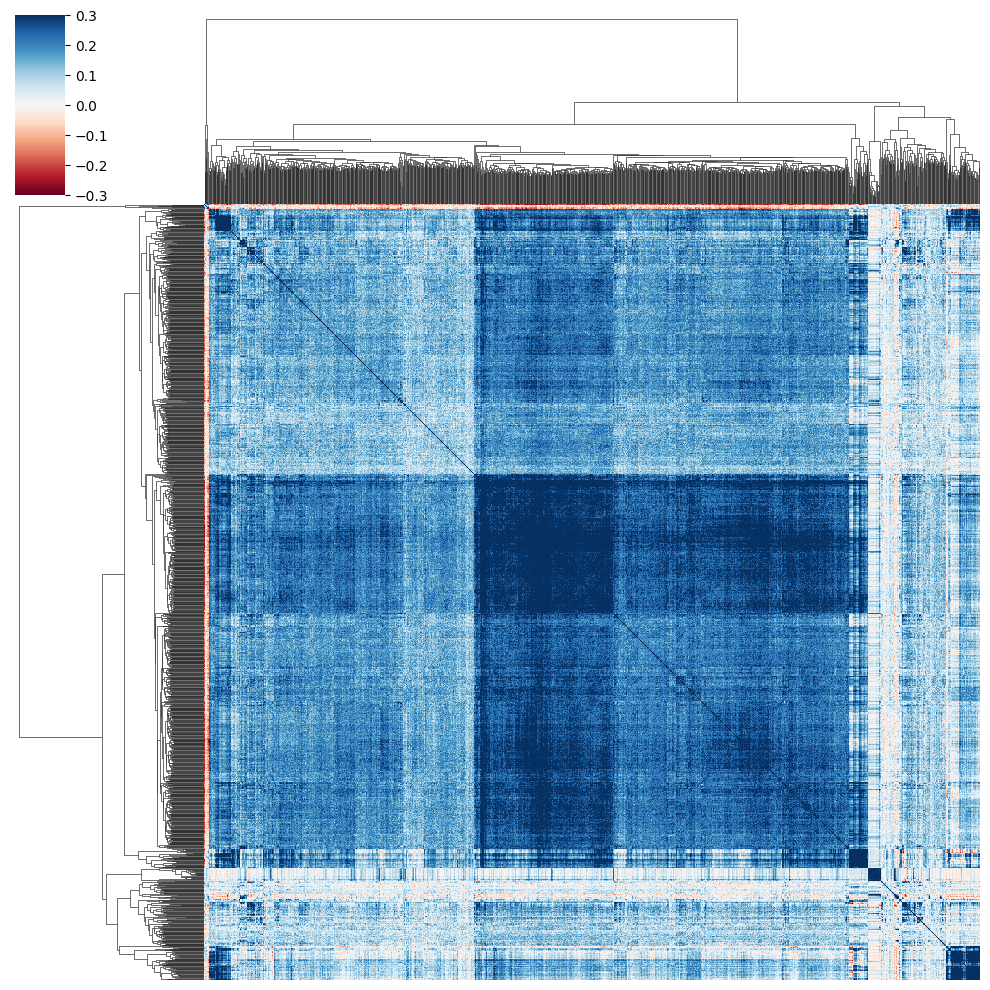

In [4]:
_ = qc2.create_corrmatrix_modified(adata_mde_z_normalized, title="", v_min=-0.3, v_max=0.3)

Compute MDE with Mali lab code 

Computing mean profiles:   0%|          | 0/1354 [00:00<?, ?it/s]

May 06 09:16:18 PM: Fitting a centered embedding into R^2, for a graph with 1354 items and 240011 edges.
May 06 09:16:18 PM: `embed` method parameters: eps=1.0e-05, max_iter=2000, memory_size=10
May 06 09:16:18 PM: iteration 0000 | distortion 2.353748 | residual norm 0.613834 | step length 0.212503 | percent change 0.250664
May 06 09:16:20 PM: iteration 0100 | distortion 0.092765 | residual norm 0.000213546 | step length 1 | percent change 0.58746
May 06 09:16:22 PM: iteration 0200 | distortion 0.090767 | residual norm 8.86987e-05 | step length 1 | percent change 0.227797
May 06 09:16:25 PM: iteration 0300 | distortion 0.089720 | residual norm 3.44217e-05 | step length 1 | percent change 0.109122
May 06 09:16:27 PM: iteration 0400 | distortion 0.089653 | residual norm 1.71654e-05 | step length 1 | percent change 0.0558884
May 06 09:16:30 PM: iteration 0500 | distortion 0.089185 | residual norm 4.36348e-05 | step length 1 | percent change 0.0442993
May 06 09:16:32 PM: iteration 0600 | d

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


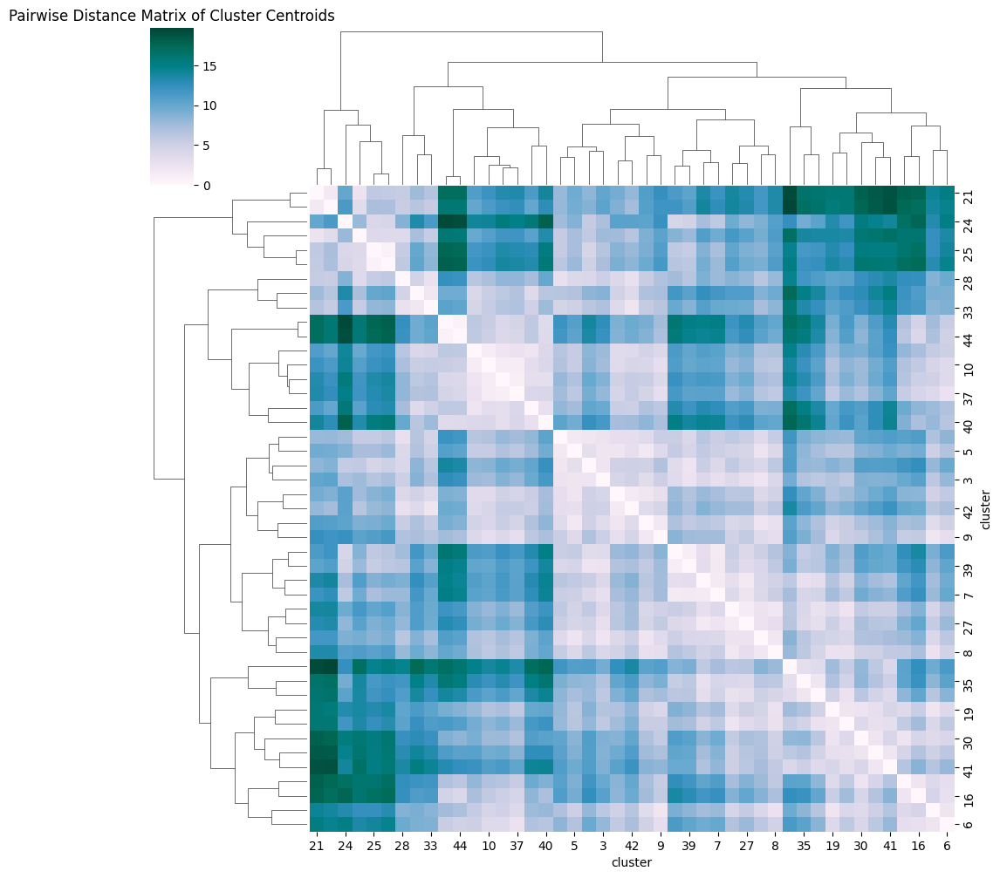

In [4]:
mde_mali = qc2.compute_MDE_2_modified(adata_mde_z_normalized, save=False, spectral=True, leiden_neighbors=8)

In [ ]:
def gene_targets_per_cluster(embedding_df):
    """
    Return DataFrame where each column contains the perturbations in a cluster.
    """
    cluster_nums = max([int(n) for n in set(embedding_df["cluster"].tolist())])
    cluster_dict = dict()
    for i in range(cluster_nums+1):
        cluster = embedding_df[embedding_df["cluster"] == str(i)]["gene_target"].tolist()
        cluster_dict[i] = cluster
    # Pad all columns to be the same length
    max_n_perts = max(len(cluster_dict[i]) for i in range(len(cluster_dict)))
    cluster_dict = {cluster:(perts + [""]*(max_n_perts-len(perts))) for cluster, perts in cluster_dict.items()}
    perts_in_cluster_df = pd.DataFrame(cluster_dict)
    return perts_in_cluster_df

In [8]:
_, _, _, _, embedding_df_mali = mde_mali
perts_in_cluster_mali = gene_targets_per_cluster(embedding_df_mali)
perts_in_cluster_mali.head()

,0,1,2,3,4,5,6,7,8,9,...,35,36,37,38,39,40,41,42,43,44
0,ABHD17A,ANAPC11,ADSL,ACOT8,ANKZF1,AP5B1,ACVR2A,ACBD4,AKTIP,ACCS,...,DPF2,AKAP8L,B3GAT3,FANCM,ABI2,CNMD,AGAP3,BRCC3,ACTMAP,AGPAT2
1,ACIN1,AP1G2,APBB1,AGGF1,ATRX,ART5,ACYP1,AGTRAP,ARHGEF5,ANTKMT,...,ERCC5,AMOTL1,CDX1,HRC,FAM50A,GALNT2,ARHGAP35,CBX2,BRK1,FLYWCH2
2,ALAS1,ARHGDIA,ASCL5,ALPL,AURKC,BCAP31,ANKRD17,ARMCX1,ASF1B,ASH1L,...,FDXR,ARID4B,CITED4,IDI1,FAM111B,KLF1,ARIH1,ENHO,DENND1C,HOXD13
3,AP1S2,BCL2L12,ATOH1,ARL6IP4,CBX3,C2orf69,C3orf52,CANX,AXIN1,ATM,...,HMGB1,HSD17B10,FAM216A,JOSD1,FBXO45,MAPKAPK5,BABAM2,EZH2,ESRP1,IFFO1
4,ARHGEF16,BRDT,ATPSCKMT,ARMC5,CCNJL,CAPRIN2,C5orf34,CCDC51,CAMK2N2,BSX,...,JRKL,IKZF5,GPR107,MARVELD1,IPO9,MED15,ETV1,KCNIP3,ESRRB,NR1D1


Compute pairwise Pearson correlation matrix with TF Project code

In [5]:
def compute_mean_profile(adata, group_indices):
    mean_vector = adata[group_indices, :].X.mean(axis=0)
    return mean_vector.A1 if hasattr(mean_vector, 'A1') else mean_vector

def tf_create_corrmatrix(adata, v_min=-1, v_max=1, color_map="RdBu"):
    gene_target_groups = adata.obs.groupby('gene_target').indices
    adata_mean_profiles = [compute_mean_profile(adata, indices) for indices in gene_target_groups.values()]
    adata_mean_profiles = np.array(adata_mean_profiles)
    corr_matrix = np.corrcoef(adata_mean_profiles)

    # Plot
    gene_target_labels = list(gene_target_groups.keys())
    distance_dataframe = pd.DataFrame(corr_matrix, index=gene_target_labels, columns=gene_target_labels)
    fig = sns.clustermap(distance_dataframe, cmap=color_map, xticklabels=False, yticklabels=False, vmax=v_max, vmin=v_min, center=0)
    fig.ax_heatmap.set_xlabel('')
    fig.ax_heatmap.set_ylabel('');
    return(distance_dataframe, adata_mean_profiles)

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.


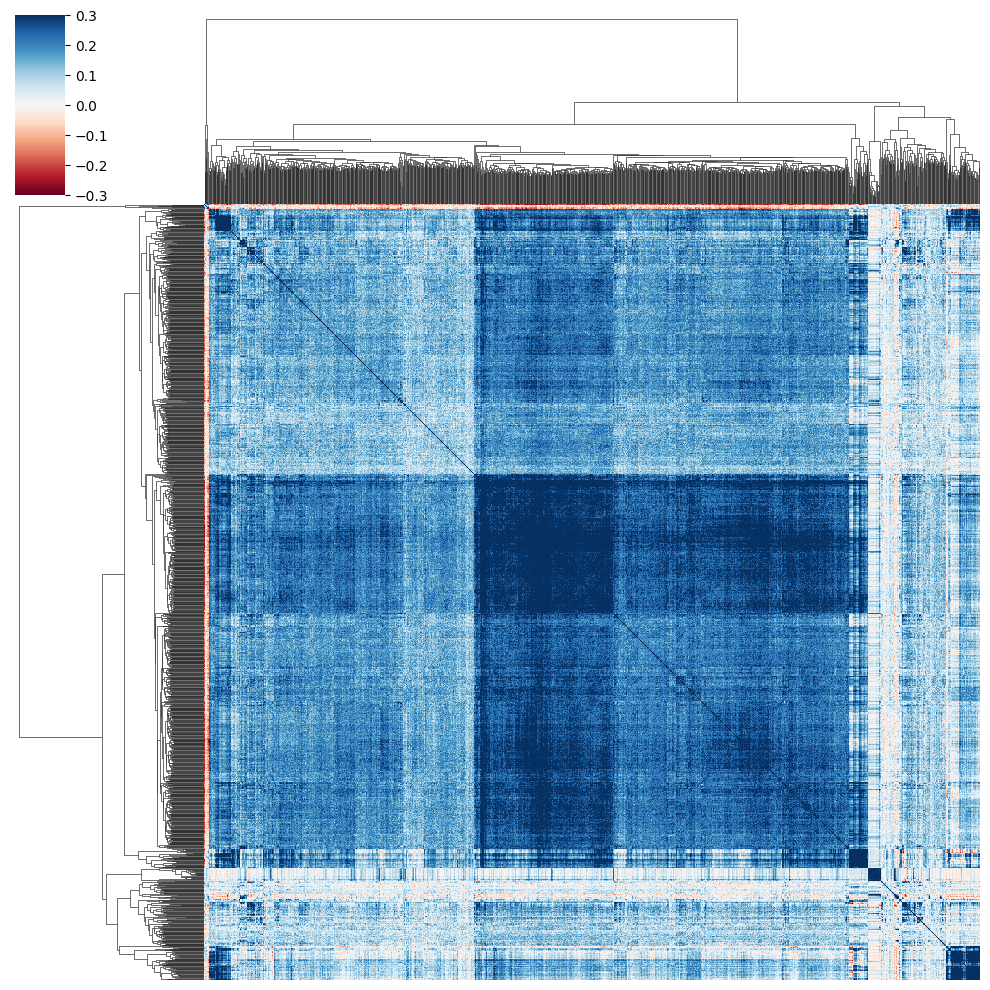

In [6]:
_ = tf_create_corrmatrix(adata_mde_z_normalized, v_min=-0.3, v_max=0.3)

Compute MDE with TF Project code

In [ ]:
def compute_mean_normalized_profile(adata, group_indices):
    mean_vector = adata[group_indices, :].X.mean(axis=0)
    normalized_mean_vector = (mean_vector - np.mean(mean_vector)) / np.std(mean_vector)
    return normalized_mean_vector.A1 if hasattr(normalized_mean_vector, 'A1') else normalized_mean_vector

def tf_compute_MDE(adata, label_points=False, leiden_neighbors=5, preserve='neighbors', spectral=False):
    adata = adata.copy()
    gene_target_groups = adata.obs.groupby('gene_target').indices
    # Changed code to no longer compute mean normalized profiles in parallel -Robin
    mean_profiles = [compute_mean_normalized_profile(adata, indices) for indices in gene_target_groups.values()]
    mean_profiles_array = np.array(mean_profiles)

    # Compute MDE
    pymde.seed(42) # Added by Robin to make pymde.preserve_neighbors() deterministic
    mde = None
    embedding = None
    if preserve == "neighbors":
        if spectral:
            spectral_embedding = SpectralEmbedding(
                n_components=30,  # Ensure this matches the pymde embedding dimension
                affinity='nearest_neighbors',
                n_neighbors=10,
                eigen_solver='arpack',
                random_state=42 # Added by Robin to make sklearn.SpectralEmbedding deterministic
            )
            initial_embedding = spectral_embedding.fit_transform(mean_profiles_array)
            mde = pymde.preserve_neighbors(initial_embedding, repulsive_fraction=15, n_neighbors = 15)
            embedding = mde.embed(max_iter=2000,print_every=100,verbose=True)
        else:
            mde = pymde.preserve_neighbors(mean_profiles_array, repulsive_fraction=15, n_neighbors=5)
            embedding = mde.embed(max_iter=4000,print_every=100,verbose=True)
    else:
        mde = pymde.preserve_distances(mean_profiles_array)
        embedding = mde.embed(max_iter=1000,print_every=100,verbose=True)

    # Run Leiden clustering on the embeddings
    knn_graph = kneighbors_graph(embedding, n_neighbors=leiden_neighbors, include_self=False)
    sources, targets = knn_graph.nonzero()
    g = ig.Graph(directed=False)
    g.add_vertices(embedding.shape[0])
    g.add_edges(zip(sources, targets))
    partition = leidenalg.find_partition(g, leidenalg.RBConfigurationVertexPartition, 
                                         seed=42 # Added by Robin to make leidenalg.find_partition() deterministic
                                         )
    
    # Get cluster labels and make pairwise correlation plot
    clusters = np.array(partition.membership)
    gene_targets = list(gene_target_groups.keys())
    embedding_df = pd.DataFrame(embedding, columns=['x', 'y'])
    embedding_df['gene_target'] = gene_targets
    embedding_df['cluster'] = clusters
    embedding_df['cluster'] = embedding_df['cluster'].astype(str)
    cluster_groups = embedding_df.groupby('cluster')
    centroids = cluster_groups[['x', 'y']].mean()
    pairwise_distances = pd.DataFrame(
        squareform(pdist(centroids, metric='euclidean')),
        index=centroids.index,
        columns=centroids.index
    )
    sns.clustermap(pairwise_distances, cmap='PuBuGn')
    plt.title('Pairwise Distance Matrix of Cluster Centroids')
    plt.show()

    # Plot using Plotly with Pastel colormap for discrete clusters
    fig = px.scatter(embedding_df, x='x', y='y', text='gene_target', color='cluster',
                     hover_data={'x': True, 'y': True, 'gene_target': True},
                     title='MDE Embedding of Mean Normalized Profiles',
                     color_discrete_sequence=px.colors.qualitative.Bold)
    fig.update_traces(marker=dict(size=7,opacity=0.7),textposition='middle center',textfont=dict(size=4))
    
    fig.update_layout(
        showlegend=True,
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        plot_bgcolor='white',
        width=1200,  # Increase plot width
        height=1000,  # Increase plot height
        legend_title_text='Cluster',
        coloraxis_showscale=False
    )
    if not label_points: # Added by Robin
        fig.update_traces(text=None)
   
    fig.show()
    
    return adata, embedding, clusters, mean_profiles_array, embedding_df

May 06 09:18:25 PM: Fitting a centered embedding into R^2, for a graph with 1354 items and 239841 edges.
May 06 09:18:25 PM: `embed` method parameters: eps=1.0e-05, max_iter=2000, memory_size=10
May 06 09:18:25 PM: iteration 0000 | distortion 2.350794 | residual norm 0.625013 | step length 0.0385656 | percent change 0.0463197
May 06 09:18:27 PM: iteration 0100 | distortion 0.093333 | residual norm 0.000208969 | step length 1 | percent change 0.452277
May 06 09:18:29 PM: iteration 0200 | distortion 0.090344 | residual norm 0.000111357 | step length 1 | percent change 0.321186
May 06 09:18:31 PM: iteration 0300 | distortion 0.089290 | residual norm 8.77215e-05 | step length 1 | percent change 0.117083
May 06 09:18:36 PM: iteration 0400 | distortion 0.088953 | residual norm 3.40251e-05 | step length 1 | percent change 0.246663
May 06 09:18:39 PM: iteration 0500 | distortion 0.088744 | residual norm 3.94579e-05 | step length 1 | percent change 0.114244
May 06 09:18:41 PM: iteration 0600 | 

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



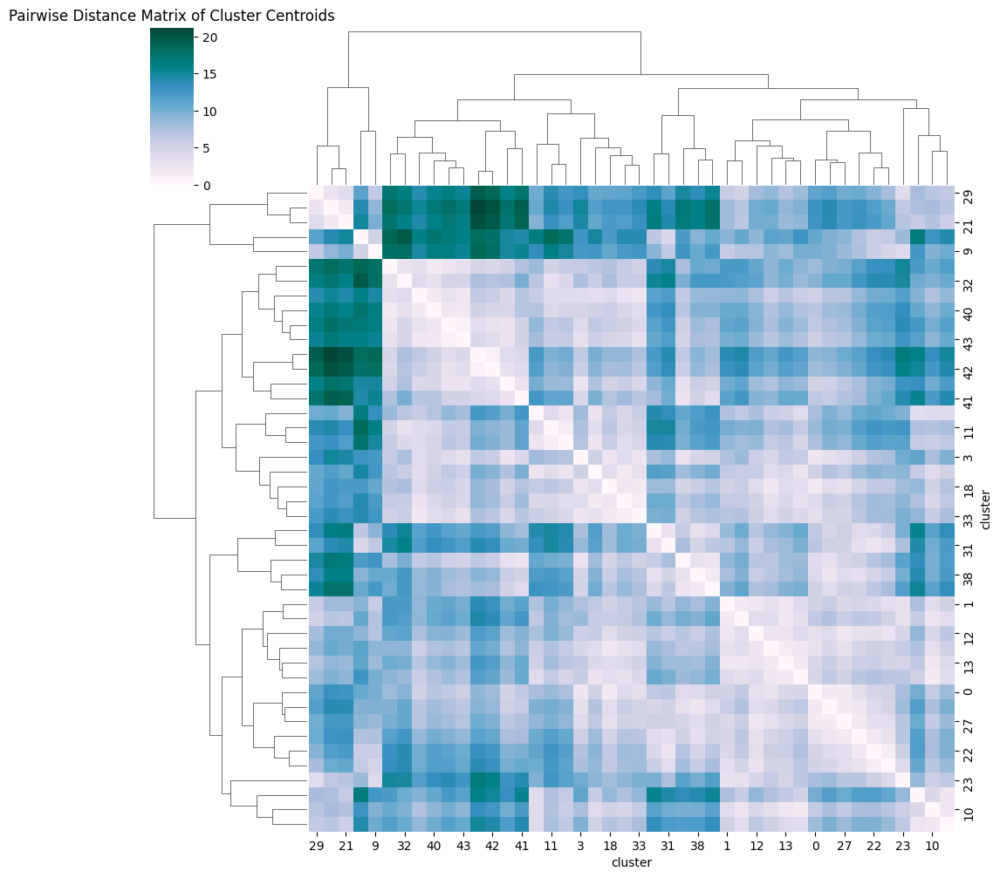

In [9]:
mde_mali_tf_code = tf_compute_MDE(adata_mde_z_normalized, label_points=False, spectral=True, leiden_neighbors=8)

In [10]:
_, _, _, _, embedding_df_mali_tf_code = mde_mali_tf_code
perts_in_cluster_mali_tf_code = gene_targets_per_cluster(embedding_df_mali_tf_code)
perts_in_cluster_mali_tf_code.head()

,0,1,2,3,4,5,6,7,8,9,...,34,35,36,37,38,39,40,41,42,43
0,ABHD17A,ACOT8,BHLHA9,ADSL,AGBL5,ANKZF1,ACYP1,ABCD4,AAAS,AKAP8L,...,DPF2,FANCM,ASB13,BTAF1,ACTB,AGAP3,ACVR2A,GALNT2,AGPAT2,ASF1A
1,ACIN1,AGGF1,BRDT,APBB1,AKAP12,ATRX,AGFG2,ADO,ABI2,ALKBH1,...,FDXR,HRC,CAPN1,CNOT2,AHSP,ARHGAP35,ANKRD17,KLF1,FLYWCH2,ATG9B
2,ALAS1,AGMAT,C12orf29,ASCL5,AP5B1,AURKC,C3orf52,AGTRAP,ACTG1,AMOTL1,...,HMGB1,IDI1,CHGB,DPH2,AK2,ARIH1,C5orf34,MED15,HOXD13,BRPF1
3,AP1S2,ANXA5,CCNO,ATOH1,BCAP31,CABLES2,CCER2,AK1,ACTN1,APELA,...,KMT2D,JOSD1,EIF2AK4,DR1,BBS10,BABAM2,DCAF12L2,MED19,IFFO1,FUBP1
4,ARHGEF16,APOL2,CHST1,ATPSCKMT,BRICD5,CBX3,CDK8,ARMCX5,ADAM19,ARF3,...,NKX6-2,MARVELD1,GALNS,DRAP1,CAPZB,ETV1,EXT2,MED24,NR1D1,KAT2A


In [36]:
n_perts_in_cluster_mali_tf_code = perts_in_cluster_mali_tf_code.nunique().tolist()
print(n_perts_in_cluster_mali_tf_code)

[72, 69, 69, 69, 56, 55, 51, 50, 47, 44, 43, 37, 36, 35, 35, 34, 32, 30, 30, 28, 28, 27, 27, 25, 25, 25, 25, 25, 24, 22, 22, 20, 19, 18, 17, 17, 16, 15, 15, 14, 13, 13, 12, 11]


In [11]:
def cluster_df_to_dict(df):
    """
    Turn a DataFrame where each column represents a KO cluster into a dict
    {cluster number: [KOs in cluster]}.
    """
    cluster_dict = {col: df[col].tolist() for col in df.columns}
    return cluster_dict

In [12]:
cluster_dict_mali = cluster_df_to_dict(perts_in_cluster_mali)
cluster_dict_mali_tf_code = cluster_df_to_dict(perts_in_cluster_mali_tf_code)

In [13]:
def compare_cluster_dicts(dict1, dict1_name, dict2, dict2_name):
    """
    Compare each KO cluster in dict1 to each KO cluster in dict2 using Jaccard similarity. 
    Output two DataFrames, one recording the Jaccard similarity
    and one recording the size of the set intersection between the two clusters.
    """
    jaccard_array = np.zeros((len(dict1), len(dict2)))
    intersection_array = np.zeros((len(dict1), len(dict2)), dtype=int)
    for i, perts1 in sorted(dict1.items()):
        set1 = set(perts1)
        for j, perts2 in sorted(dict2.items()):
            set2 = set(perts2)
            # Compute Jaccard index
            intersection = len(set1.intersection(set2))
            union = len(set1.union(set2))
            jaccard_array[i, j] = round(intersection/union, 3)
            # Record intersection
            intersection_array[i, j] = intersection
    # Create DataFrame
    row_names = [f"{dict1_name}_CL_{i}" for i in range(len(dict1))]
    col_names = [f"{dict2_name}_CL_{j}" for j in range(len(dict2))]
    jaccard_df = pd.DataFrame(jaccard_array, columns=col_names, index=row_names)
    intersection_df = pd.DataFrame(intersection_array, columns=col_names, index=row_names)
    return jaccard_df, intersection_df

In [14]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [22]:
jaccard_comparison, intersection_comparison = \
    compare_cluster_dicts(cluster_dict_mali, "Study", cluster_dict_mali_tf_code, "TFCode")

In [16]:
def cluster_heatmap(cluster_comparison_df, jaccard, rows_name, cols_name, title, color_map="crest"):
    row_names = [i for i in range(cluster_comparison_df.shape[0])]
    col_names = [j for j in range(cluster_comparison_df.shape[1])]
    df = pd.DataFrame(cluster_comparison_df.values, columns=col_names, index=row_names)
    if jaccard:
        ax = sns.heatmap(df, vmin=0, vmax=1, cmap=color_map)
    else:
        ax = sns.heatmap(df, cmap=color_map)
    ax.set_ylabel(rows_name)
    ax.set_xlabel(cols_name)
    ax.set_title(title)

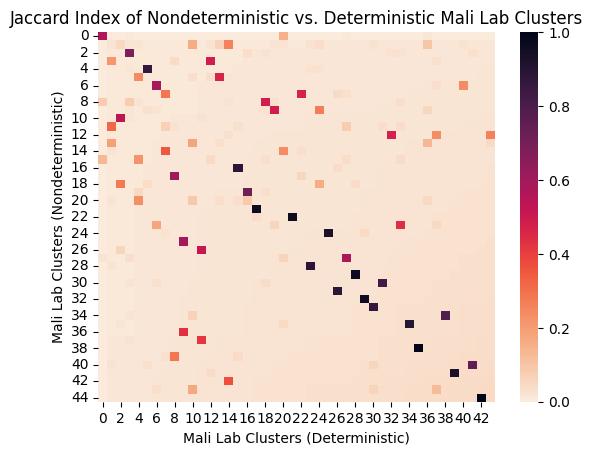

In [19]:
p = cluster_heatmap(jaccard_comparison, jaccard=True,
    rows_name="Mali Lab Clusters (Nondeterministic)", cols_name="Mali Lab Clusters (Deterministic)",
    title="Jaccard Index of Nondeterministic vs. Deterministic Mali Lab Clusters", color_map="rocket_r")

This heatmap compares the clusters found with the Mali lab code (that uses nondeterministic methods which lead to different cluster membership each time the code is run) to the clusters found with my TF project code (which uses seeds to make these methods deterministic, so cluster membership is the same each time the code is run). 

It seems like most of the nondeterministic clusters have a deterministic cluster match, but not all of them.

In [24]:
perts_in_cluster_mali_tf_code.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43
0,ABHD17A,ACOT8,BHLHA9,ADSL,AGBL5,ANKZF1,ACYP1,ABCD4,AAAS,AKAP8L,AKAP17A,B3GAT3,ALPL,ART5,ARHGDIA,ARHGEF12,APOBEC3D,COQ4,ADAMTS15,ANTKMT,AP1G2,BOD1L1,ACBD4,BCL2L12,ACCS,BLOC1S2,ABCF1,APCDD1L,CREBBP,C1QBP,ACTMAP,ACLY,ATMIN,ASB7,DPF2,FANCM,ASB13,BTAF1,ACTB,AGAP3,ACVR2A,GALNT2,AGPAT2,ASF1A
1,ACIN1,AGGF1,BRDT,APBB1,AKAP12,ATRX,AGFG2,ADO,ABI2,ALKBH1,ANAPC11,CDX1,ARL6IP4,BTBD10,BRCC3,CASP6,ATP5MC1,GADD45GIP1,AKTIP,ATM,C6orf120,CYB5RL,ARMCX1,CD276,ASH1L,COX7B,APAF1,CAND2,CSNK2B,MRPL12,CBFB,CCNQ,BABAM1,BARX1,FDXR,HRC,CAPN1,CNOT2,AHSP,ARHGAP35,ANKRD17,KLF1,FLYWCH2,ATG9B
2,ALAS1,AGMAT,C12orf29,ASCL5,AP5B1,AURKC,C3orf52,AGTRAP,ACTG1,AMOTL1,ARRDC1,CITED4,ATP5MC2,CHAD,CBX2,CCDC6,CHCHD2,GFM1,ARHGEF5,CCNB3,CIZ1,DDX28,BARHL1,COIL,BSX,ECSIT,ASPHD1,CDCA7,DBR1,MRPS5,CLNS1A,CKS1B,CABIN1,CACUL1,HMGB1,IDI1,CHGB,DPH2,AK2,ARIH1,C5orf34,MED15,HOXD13,BRPF1
3,AP1S2,ANXA5,CCNO,ATOH1,BCAP31,CABLES2,CCER2,AK1,ACTN1,APELA,BRK1,DTX3L,CCN2,CHDH,DOT1L,CDH2,CIR1,GRSF1,ASF1B,CGAS,DHCR7,GATB,CCDC51,CRISPLD1,CREBL2,FAM120AOS,BAX,CNIH1,DOHH,MRPS7,EBF2,CMTR1,CHAMP1,CENPB,KMT2D,JOSD1,EIF2AK4,DR1,BBS10,BABAM2,DCAF12L2,MED19,IFFO1,FUBP1
4,ARHGEF16,APOL2,CHST1,ATPSCKMT,BRICD5,CBX3,CDK8,ARMCX5,ADAM19,ARF3,CBLL1,FAM91A1,CGB7,COPS9,EI24,CRELD1,COA6,MRPL10,AXIN1,CHRNA9,ECE2,LARS2,CCDC78,DEPDC1B,ERI2,FLCN,CASP3,COQ7,EP300,MRPS9,EMC8,CNOT7,CUL1,COG7,NKX6-2,MARVELD1,GALNS,DRAP1,CAPZB,ETV1,EXT2,MED24,NR1D1,KAT2A


In [28]:
# List of 1639 TFs from Lambert et al (2018)
lambert_csv = pd.read_csv("Lambert_2018_TFs.csv")
tfs = lambert_csv[lambert_csv.iloc[:,3] == "Yes"].iloc[:,1].tolist()
tfs = set(tfs)

def tf_ko_per_cluster_df(perts_in_cluster_df):
    tf_ko_dict = dict()
    # Get TF KOs in each column
    for i, col in perts_in_cluster_df.items():
        col_perts = col.tolist()
        tf_kos = [pert for pert in col_perts if pert in tfs]
        tf_ko_dict[i] = tf_kos
    # Pad each column to same length
    max_col_len = max([len(val) for val in tf_ko_dict.values()])
    for i, col in tf_ko_dict.items():
        tf_ko_dict[i] += ([""]*(max_col_len - len(col)))
    tf_ko_df = pd.DataFrame(tf_ko_dict)
    return tf_ko_df

In [29]:
tf_kos_in_cluster_mali_tf_code = tf_ko_per_cluster_df(perts_in_cluster_mali_tf_code)

In [30]:
display(tf_kos_in_cluster_mali_tf_code)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43
0,FOXK1,,BHLHA9,ASCL5,DMRT2,ANKZF1,E2F4,CREM,ELK1,AKAP8L,CREB3L4,CDX1,ZNF583,ZNF705D,CBX2,DLX4,HLF,MTERF4,MXD1,ESR1,FOXD4L5,MTERF3,BARHL1,GRHL2,ASH1L,,,ZNF706,LIN28B,,EBF2,SOX4,ATMIN,BARX1,NKX6-2,PHF20,ZBTB42,DR1,,ARHGAP35,,KLF1,HOXD13,ZNF253
1,GATA5,,DUXA,ATOH1,NFIL3,CSRNP2,ETS1,FOXK2,,IKZF5,ESRRB,NFKB2,,,DOT1L,SETDB1,SALL4,,NEUROG3,FOXJ2,NME2,ZBTB41,,THAP12,BSX,,,,,,GTF2IRD1,ZNF219,CHAMP1,CENPB,SP1,POU3F2,ZNF549,DRAP1,,ETV1,,NANOG,NR1D1,
2,MSANTD4,,ESR2,ESRRA,ZNF16,FOXA1,FOXH1,ZNF563,,TCF7L2,L3MBTL4,POU4F3,,,ETV5,ZNF205,SNAI1,,THAP8,HES7,SRF,,,USF2,CREBL2,,,,,,SNAPC5,,DNMT1,GTF2I,,POU5F1,,,,HHEX,,NANOGP8,RBPJ,
3,NOTO,,ETS2,FOXE3,ZNF735,GATAD2A,POU2F1,,,ZNF44,PATZ1,TCF3,,,KCNIP3,ZNF408,TBPL1,,ZBTB22,MTF2,ZNF510,,,,FOSB,,,,,,ZNF383,,JUNB,ZNF200,,POU5F1B,,,,,,PRDM14,TCF12,
4,NR0B1,,ISL1,GLIS3,,HNF1B,SMAD4,,,,,ZBTB34,,,NFXL1,,ZNF614,,ZNF75D,NKX2-4,,,,,FOXS1,,,,,,ZNF420,,PITX3,ZNF326,,,,,,,,PURG,ZNF396,
5,THRA,,JRKL,HES6,,MITF,TCF7L1,,,,,ZNF462,,,NR1I3,,ZNF683,,ZNF268,NR4A3,,,,,HDX,,,,,,,,VDR,,,,,,,,,ZNF423,ZNF521,
6,TIGD6,,MEOX2,IRX5,,NANOGNB,ZNF552,,,,,ZNF572,,,PKNOX2,,,,ZNF354A,THAP7,,,,,OSR2,,,,,,,,,,,,,,,,,,,
7,ZFP30,,ONECUT2,MAFG,,NEUROD4,ZNF783,,,,,ZNF616,,,SOX12,,,,,ZNF461,,,,,PCGF6,,,,,,,,,,,,,,,,,,,
8,ZNF32,,PA2G4,NR3C2,,PHF1,,,,,,ZNF660,,,THAP5,,,,,,,,,,PLSCR1,,,,,,,,,,,,,,,,,,,
9,,,PROX2,PRDM12,,PPARD,,,,,,ZNF732,,,,,,,,,,,,,POU3F3,,,,,,,,,,,,,,,,,,,


In [31]:
tf_kos_in_cluster_mali_tf_code.to_csv("/home/ranwyl/results_tf_project/mali_lab_tf_ko_clusters_deterministic.csv")

In [32]:
tf_kos_in_cluster_mali = tf_ko_per_cluster_df(perts_in_cluster_mali)

In [33]:
display(tf_kos_in_cluster_mali)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44
0,FOXD4L5,CREB3L4,ASCL5,ELK1,ANKZF1,ZNF705D,ETS1,,ESRRA,ASH1L,BHLHA9,,ATMIN,ZNF549,BARHL1,ZFP30,DLX4,,CREBL2,SALL4,DMRT2,MTERF4,MTERF3,BARX1,,TCF7L2,NFKB2,ZNF395,GRHL2,LIN28B,SOX4,,,EBF2,,JRKL,AKAP8L,CDX1,PHF20,,KLF1,ARHGAP35,CBX2,ESRRB,HOXD13
1,FOXK1,ETV5,ATOH1,ZNF583,CSRNP2,,FOXH1,,MSANTD4,BSX,PROX2,,CHAMP1,,CREM,,SETDB1,,DUXA,SNAI1,ZNF16,,ZBTB41,E2F4,,ZNF44,ONECUT2,ZNF706,THAP12,,ZNF75D,,,GTF2IRD1,,NKX6-2,IKZF5,NR3C2,POU3F2,,NANOG,ETV1,KCNIP3,,NR1D1
2,GATA5,L3MBTL4,CENPB,,FOXA1,,,,NEUROG3,ESR1,SHOX,,DNMT1,,FOXK2,,ZNF205,,ESR2,TBPL1,ZNF735,,,GTF2I,,,PA2G4,,USF2,,ZNF219,,,SNAPC5,,SP1,,ZNF462,POU5F1,,NANOGNB,HHEX,NFXL1,,RBPJ
3,NR0B1,NR1I3,FOXE3,,GATAD2A,,,,NFIL3,FOSB,SRY,,DOT1L,,NME2,,ZNF408,,ETS2,ZNF614,,,,MTF2,,,POU4F3,,,,,,,ZNF383,,,,ZNF660,POU5F1B,,NANOGP8,,PKNOX2,,TCF12
4,SRF,PATZ1,GLIS3,,HNF1B,,,,NOTO,FOXJ2,TMF1,,DR1,,ZNF563,,,,ISL1,,,,,POU2F1,,,TCF3,,,,,,,ZNF420,,,,,,,PRDM14,,THAP5,,ZNF396
5,THRA,SOX12,HES6,,NEUROD4,,,,SCX,FOXS1,TSC22D1,,DRAP1,,,,,,MEOX2,,,,,SMAD4,,,ZBTB34,,,,,,,,,,,,,,PURG,,,,ZNF521
6,TIGD6,ZBTB42,HLF,,PHF1,,,,THAP8,HDX,ZBTB33,,JUNB,,,,,,MITF,,,,,TCF7L1,,,ZNF572,,,,,,,,,,,,,,ZNF423,,,,
7,ZNF32,ZNF573,IRX5,,PPARD,,,,ZBTB22,HES7,ZHX1,,PITX3,,,,,,OSR2,,,,,ZNF200,,,ZNF616,,,,,,,,,,,,,,,,,,
8,ZNF510,,MAFG,,PRDM8,,,,ZFP41,MXD1,ZNF48,,VDR,,,,,,ZFP69B,,,,,ZNF326,,,ZNF732,,,,,,,,,,,,,,,,,,
9,,,PRDM12,,SETDB2,,,,ZNF268,NKX2-4,ZNF256,,ZNF253,,,,,,ZNF267,,,,,ZNF552,,,ZNF888,,,,,,,,,,,,,,,,,,


In [34]:
tf_kos_in_cluster_mali.to_csv("/home/ranwyl/results_tf_project/mali_lab_tf_ko_clusters_nondeterministic.csv")

In [37]:
tf_ko_cluster_dict_mali = cluster_df_to_dict(tf_kos_in_cluster_mali)
tf_ko_cluster_dict_mali_tf_code = cluster_df_to_dict(tf_kos_in_cluster_mali_tf_code)
tf_jaccard_comparison, tf_intersection_comparison = \
    compare_cluster_dicts(tf_ko_cluster_dict_mali, "Study", tf_ko_cluster_dict_mali_tf_code, "TFCode")

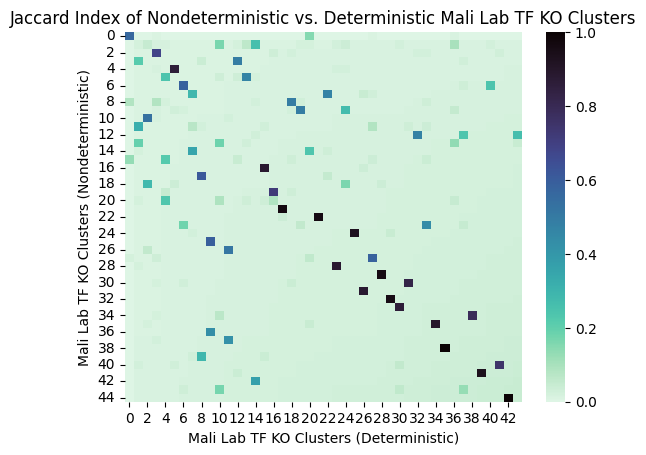

In [38]:
p = cluster_heatmap(jaccard_comparison, jaccard=True,
    rows_name="Mali Lab TF KO Clusters (Nondeterministic)", cols_name="Mali Lab TF KO Clusters (Deterministic)",
    title="Jaccard Index of Nondeterministic vs. Deterministic Mali Lab TF KO Clusters", color_map="mako_r")